# NP Scaling Hypothesis Tests in Colab

This notebook uses one small synthetic vector-regression task to test two hypotheses:

1. `np_fixed` struggles more when incoming activation scales differ across layers, which often happens more when layer sizes differ a lot.
2. `np_fixed` and `np_fan_in` both struggle when the raw input scale is mismatched to hidden-layer scales.

All three sections below use the same workflow:
- grid search
- optional single-config runner
- frozen-backprop estimator analysis
- frozen-backprop sigma search

The three sections are:
- `8 -> 8 -> 8 -> 1`, input in `[-1, 1]`
- `8 -> 32 -> 2 -> 1`, input in `[-1, 1]`
- `8 -> 8 -> 8 -> 1`, input in `[-5, 5]`


In [3]:
import itertools
import math
import random
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from IPython.display import display
from torch.utils.data import DataLoader, TensorDataset, Subset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if hasattr(torch, "set_float32_matmul_precision"):
    torch.set_float32_matmul_precision("high")


def set_seed(seed: int) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed(0)
print(f"device={device}")
if device.type == "cuda":
    print(torch.cuda.get_device_name(0))


device=cuda
Tesla T4


In [4]:
METHODS = ["bp", "np", "np_fan_in", "np_fixed", "wp"]
METHOD_LABELS = {
    "bp": "Backprop",
    "np": "Node Perturbation",
    "np_fan_in": "Node Perturbation Fan-In",
    "np_fixed": "Node Perturbation Fixed Sigma",
    "wp": "Weight Perturbation",
}
METHOD_COLORS = {
    "bp": "C0",
    "np": "C1",
    "np_fan_in": "C4",
    "np_fixed": "C3",
    "wp": "C2",
}


class MLP(nn.Module):
    def __init__(self, dimensions, activation=torch.sigmoid, output_activation=None, require_grad=False):
        super().__init__()
        self.layers = nn.ModuleList(
            [nn.Linear(dimensions[i], dimensions[i + 1], bias=True) for i in range(len(dimensions) - 1)]
        )
        self.activation = activation
        self.output_activation = output_activation
        if not require_grad:
            for p in self.parameters():
                p.requires_grad_(False)

    def forward(self, x):
        final_layer = len(self.layers) - 1
        h = x
        for i, layer in enumerate(self.layers):
            u = layer(h)
            if i == final_layer:
                h = self.output_activation(u) if self.output_activation else u
            else:
                h = self.activation(u)
        return h

    def forward_weight_perturb(self, x, sigma):
        batch_size = x.shape[0]
        xs = [x]
        ys = []
        noises = []
        h = x
        for i, layer in enumerate(self.layers):
            w = layer.weight
            b = layer.bias
            eps_w = torch.randn(batch_size, *w.shape, device=w.device, dtype=w.dtype) * sigma
            eps_b = torch.randn(batch_size, *b.shape, device=b.device, dtype=b.dtype) * sigma
            w_used = w.unsqueeze(0) + eps_w
            b_used = b.unsqueeze(0) + eps_b
            u = torch.bmm(h.unsqueeze(1), w_used.transpose(1, 2)).squeeze(1) + b_used
            final_layer = len(self.layers) - 1
            if i == final_layer:
                h = self.output_activation(u) if self.output_activation else u
                ys.append(h)
            else:
                h = self.activation(u)
                ys.append(h)
                xs.append(h)
            noises.append((eps_w, eps_b))
        return ys, xs, noises

    def forward_node_perturb(self, x, sigma):
        acts = [x]
        noises = []
        noise_scales = []
        last = len(self.layers) - 1
        a_noisy = x
        for i, layer in enumerate(self.layers):
            x_in = a_noisy
            z_noisy = layer(a_noisy)
            eps = torch.randn_like(z_noisy)
            noise_scale = sigma * torch.sqrt(1.0 + x_in.pow(2).sum(dim=1, keepdim=True))
            noises.append(eps)
            noise_scales.append(noise_scale)
            z_noisy = z_noisy + noise_scale * eps
            if i == last:
                a_noisy = self.output_activation(z_noisy) if self.output_activation else z_noisy
            else:
                a_noisy = self.activation(z_noisy)
            acts.append(a_noisy)
        return acts, noises, noise_scales, a_noisy

    def forward_node_perturb_fixed_sigma(self, x, sigma):
        acts = [x]
        noises = []
        noise_scales = []
        last = len(self.layers) - 1
        a_noisy = x
        for i, layer in enumerate(self.layers):
            z_noisy = layer(a_noisy)
            eps = torch.randn_like(z_noisy)
            noise_scale = torch.full_like(z_noisy, sigma)
            noises.append(eps)
            noise_scales.append(noise_scale)
            z_noisy = z_noisy + noise_scale * eps
            if i == last:
                a_noisy = self.output_activation(z_noisy) if self.output_activation else z_noisy
            else:
                a_noisy = self.activation(z_noisy)
            acts.append(a_noisy)
        return acts, noises, noise_scales, a_noisy


    def forward_node_perturb_fan_in_scaled(self, x, sigma):
        acts = [x]
        noises = []
        noise_scales = []
        last = len(self.layers) - 1
        a_noisy = x
        for i, layer in enumerate(self.layers):
            z_noisy = layer(a_noisy)
            eps = torch.randn_like(z_noisy)
            fan_in_with_bias = layer.in_features + 1
            noise_scale_value = sigma * math.sqrt(fan_in_with_bias)
            noise_scale = torch.full_like(z_noisy, noise_scale_value)
            noises.append(eps)
            noise_scales.append(noise_scale)
            z_noisy = z_noisy + noise_scale * eps
            if i == last:
                a_noisy = self.output_activation(z_noisy) if self.output_activation else z_noisy
            else:
                a_noisy = self.activation(z_noisy)
            acts.append(a_noisy)
        return acts, noises, noise_scales, a_noisy


def _mean_loss_per_sample(prediction, target):
    loss = F.mse_loss(prediction, target, reduction="none")
    if loss.dim() > 1:
        loss = loss.mean(dim=1)
    return loss.view(-1)


def _centered_reward_signal(loss_per_sample):
    reward = -loss_per_sample
    return reward - reward.mean()


def _flatten_parameter_tensors(weight_tensors, bias_tensors):
    pieces = []
    for weight_tensor, bias_tensor in zip(weight_tensors, bias_tensors):
        pieces.append(weight_tensor.reshape(-1))
        pieces.append(bias_tensor.reshape(-1))
    return torch.cat(pieces)


def node_perturbation_step(model, X, target, eta=0.5, sigma=0.1, return_unscaled_parameter_update_vector=False):
    model.train()
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb(X, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, target)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    with torch.no_grad():
        for layer, x_in, noise, noise_scale in zip(model.layers, activations, noises, noise_scales):
            scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
            raw_weight_update = torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0)
            raw_bias_update = scaled_noise.mean(dim=0)
            raw_weight_updates.append(raw_weight_update)
            raw_bias_updates.append(raw_bias_update)
            layer.weight += eta * raw_weight_update
            layer.bias += eta * raw_bias_update
    mean_loss = loss_per_sample.mean().item()
    if return_unscaled_parameter_update_vector:
        return mean_loss, _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)
    return mean_loss


def node_perturbation_step_fixed_sigma(model, X, target, eta=0.5, sigma=0.1, return_unscaled_parameter_update_vector=False):
    model.train()
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb_fixed_sigma(X, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, target)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    with torch.no_grad():
        for layer, x_in, noise, noise_scale in zip(model.layers, activations, noises, noise_scales):
            scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
            raw_weight_update = torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0)
            raw_bias_update = scaled_noise.mean(dim=0)
            raw_weight_updates.append(raw_weight_update)
            raw_bias_updates.append(raw_bias_update)
            layer.weight += eta * raw_weight_update
            layer.bias += eta * raw_bias_update
    mean_loss = loss_per_sample.mean().item()
    if return_unscaled_parameter_update_vector:
        return mean_loss, _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)
    return mean_loss


def node_perturbation_step_fan_in_scaled(model, X, target, eta=0.5, sigma=0.1, return_unscaled_parameter_update_vector=False):
    model.train()
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb_fan_in_scaled(X, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, target)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    with torch.no_grad():
        for layer, x_in, noise, noise_scale in zip(model.layers, activations, noises, noise_scales):
            scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
            raw_weight_update = torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0)
            raw_bias_update = scaled_noise.mean(dim=0)
            raw_weight_updates.append(raw_weight_update)
            raw_bias_updates.append(raw_bias_update)
            layer.weight += eta * raw_weight_update
            layer.bias += eta * raw_bias_update
    mean_loss = loss_per_sample.mean().item()
    if return_unscaled_parameter_update_vector:
        return mean_loss, _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)
    return mean_loss


def weight_perturb_step(model, X, target, eta=0.5, sigma=0.1, return_unscaled_parameter_update_vector=False):
    model.train()
    layer_outputs, _, noises = model.forward_weight_perturb(X, sigma)
    prediction_noisy = layer_outputs[-1]
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, target)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    noise_scale = sigma ** 2 + 1e-12
    raw_weight_updates = []
    raw_bias_updates = []
    with torch.no_grad():
        for layer, (weight_noise, bias_noise) in zip(model.layers, noises):
            scaled_weight_noise = scalar_signal.view(-1, 1, 1) * weight_noise / noise_scale
            scaled_bias_noise = scalar_signal.view(-1, 1) * bias_noise / noise_scale
            raw_weight_update = scaled_weight_noise.mean(dim=0)
            raw_bias_update = scaled_bias_noise.mean(dim=0)
            raw_weight_updates.append(raw_weight_update)
            raw_bias_updates.append(raw_bias_update)
            layer.weight += eta * raw_weight_update
            layer.bias += eta * raw_bias_update
    mean_loss = loss_per_sample.mean().item()
    if return_unscaled_parameter_update_vector:
        return mean_loss, _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)
    return mean_loss


def backprop_step(model, X, target, optimizer, loss_fn=F.mse_loss, return_unscaled_parameter_update_vector=False):
    model.train()
    for p in model.parameters():
        p.requires_grad_(True)
    optimizer.zero_grad()
    y_pred = model(X)
    loss = loss_fn(y_pred, target, reduction="mean")
    loss.backward()
    weight_grads = [layer.weight.grad.detach().clone() for layer in model.layers]
    bias_grads = [layer.bias.grad.detach().clone() for layer in model.layers]
    optimizer.step()
    if return_unscaled_parameter_update_vector:
        return loss.item(), -_flatten_parameter_tensors(weight_grads, bias_grads)
    return loss.item()


def model_weight_norm(model):
    total = torch.tensor(0.0, device=next(model.parameters()).device)
    for layer in model.layers:
        total = total + layer.weight.detach().pow(2).sum()
    return float(torch.sqrt(total))


def mean_layer_output_norms(model, loader, device, normalize_by_sqrt_fan_in=False):
    model.eval()
    summed_norms = [0.0 for _ in model.layers]
    total_examples = 0

    with torch.no_grad():
        for batch in loader:
            if len(batch) == 3:
                xb, _, _ = batch
            else:
                xb, _ = batch
            xb = xb.to(device, non_blocking=True)
            h = xb
            batch_size = xb.size(0)

            for layer_idx, layer in enumerate(model.layers):
                h_for_norm = h if h.dim() > 1 else h.unsqueeze(1)
                current_norm = torch.norm(h_for_norm, dim=1)
                if normalize_by_sqrt_fan_in:
                    current_norm = current_norm / math.sqrt(h_for_norm.shape[1] + 1)
                summed_norms[layer_idx] += current_norm.sum().item()
                u = layer(h)
                if layer_idx == len(model.layers) - 1:
                    h = model.output_activation(u) if model.output_activation else u
                else:
                    h = model.activation(u)

            total_examples += batch_size

    return [value / max(total_examples, 1) for value in summed_norms]


def mean_normalized_layer_output_norms(model, loader, device):
    return mean_layer_output_norms(model, loader, device, normalize_by_sqrt_fan_in=True)


def mean_raw_layer_output_norms(model, loader, device):
    return mean_layer_output_norms(model, loader, device, normalize_by_sqrt_fan_in=False)


def _random_subset_indices(n, limit, seed):
    if limit is None or limit >= n:
        return torch.arange(n)
    g = torch.Generator().manual_seed(seed)
    return torch.randperm(n, generator=g)[:limit]


def _maybe_subset_dataset(dataset, limit, seed):
    if limit is None or limit >= len(dataset):
        return dataset
    indices = _random_subset_indices(len(dataset), limit, seed)
    return Subset(dataset, indices.tolist())


def regression_r2_score(y_true, y_pred):
    ss_res = torch.sum((y_true - y_pred) ** 2)
    target_mean = torch.mean(y_true, dim=0, keepdim=True)
    ss_tot = torch.sum((y_true - target_mean) ** 2)
    if float(ss_tot) < 1e-12:
        return 0.0
    return float(1.0 - ss_res / (ss_tot + 1e-12))


def evaluate_model(model, loader, device):
    model.eval()
    total_loss = 0.0
    total_examples = 0
    predictions = []
    targets = []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            pred = model(xb)
            loss = F.mse_loss(pred, yb, reduction="mean")
            total_loss += loss.item() * xb.size(0)
            total_examples += xb.size(0)
            predictions.append(pred.detach().cpu())
            targets.append(yb.detach().cpu())
    mean_loss = total_loss / max(total_examples, 1)
    y_pred = torch.cat(predictions, dim=0)
    y_true = torch.cat(targets, dim=0)
    r2 = regression_r2_score(y_true, y_pred)
    return mean_loss, r2


def predict_tensor(model, x, device):
    model.eval()
    with torch.no_grad():
        return model(x.to(device)).detach().cpu()


def make_model(dimensions, require_grad, device):
    return MLP(dimensions, activation=torch.sigmoid, require_grad=require_grad).to(device)


def build_initial_state_dict(dimensions, seed, device, first_layer_weight_scale=1.0):
    set_seed(seed)
    base_model = make_model(dimensions, require_grad=True, device=device)
    state_dict = {name: tensor.detach().clone() for name, tensor in base_model.state_dict().items()}
    if first_layer_weight_scale != 1.0:
        state_dict["layers.0.weight"] = state_dict["layers.0.weight"] * first_layer_weight_scale
    del base_model
    if device.type == "cuda":
        torch.cuda.empty_cache()
    return state_dict


def train_one_run(
    method,
    run_config,
    data,
    dimensions,
    epochs,
    seed,
    device,
    print_every_epoch=1,
    divergence_loss_threshold=5.0,
    first_layer_weight_scale=1.0,
):
    base_state = build_initial_state_dict(
        dimensions=dimensions,
        seed=seed,
        device=device,
        first_layer_weight_scale=first_layer_weight_scale,
    )

    require_grad = method == "bp"
    model = make_model(dimensions, require_grad=require_grad, device=device)
    model.load_state_dict(base_state)

    optimizer = None
    if method == "bp":
        optimizer = torch.optim.SGD(model.parameters(), lr=run_config["lr"])

    history = {
        "epoch": [],
        "train_loss": [],
        "train_r2": [],
        "test_loss": [],
        "test_r2": [],
        "weight_norm": [],
        "layer_output_norms": [],
        "layer_output_norms_raw": [],
    }

    diverged = False
    best_test_loss = float("inf")
    best_test_r2 = -float("inf")
    start_time = time.time()

    train_loader = data["train_loader"]
    train_eval_loader = data["train_eval_loader"]
    test_loader = data["test_loader"]

    for epoch in range(1, epochs + 1):
        model.train()
        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)

            if method == "bp":
                backprop_step(model, xb, yb, optimizer=optimizer)
            elif method == "np":
                node_perturbation_step(model, xb, yb, eta=run_config["lr"], sigma=run_config["sigma"])
            elif method == "np_fan_in":
                node_perturbation_step_fan_in_scaled(model, xb, yb, eta=run_config["lr"], sigma=run_config["sigma"])
            elif method == "np_fixed":
                node_perturbation_step_fixed_sigma(model, xb, yb, eta=run_config["lr"], sigma=run_config["sigma"])
            elif method == "wp":
                weight_perturb_step(model, xb, yb, eta=run_config["lr"], sigma=run_config["sigma"])
            else:
                raise ValueError(f"Unknown method: {method}")

        train_loss, train_r2 = evaluate_model(model, train_eval_loader, device)
        test_loss, test_r2 = evaluate_model(model, test_loader, device)

        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["train_r2"].append(train_r2)
        history["test_loss"].append(test_loss)
        history["test_r2"].append(test_r2)
        history["weight_norm"].append(model_weight_norm(model))
        history["layer_output_norms"].append(mean_normalized_layer_output_norms(model, train_eval_loader, device))
        history["layer_output_norms_raw"].append(mean_raw_layer_output_norms(model, train_eval_loader, device))

        best_test_loss = min(best_test_loss, test_loss)
        best_test_r2 = max(best_test_r2, test_r2)

        if (not math.isfinite(train_loss)) or (not math.isfinite(test_loss)) or test_loss > divergence_loss_threshold:
            diverged = True
            print(
                f"    diverged at epoch {epoch}/{epochs} | "
                f"train_loss={train_loss:.4f}, test_loss={test_loss:.4f}, test_r2={test_r2:.4f}"
            )
            break

        if epoch % print_every_epoch == 0 or epoch == 1 or epoch == epochs:
            sigma_str = f", sigma={run_config['sigma']:.4g}" if "sigma" in run_config else ""
            print(
                f"    epoch {epoch:2d}/{epochs} | {method} | lr={run_config['lr']:.4g}{sigma_str} | "
                f"train_loss={train_loss:.4f}, train_r2={train_r2:.4f}, "
                f"test_loss={test_loss:.4f}, test_r2={test_r2:.4f}"
            )

    duration_sec = time.time() - start_time
    state_dict_cpu = {name: tensor.detach().cpu().clone() for name, tensor in model.state_dict().items()}
    result = {
        "method": method,
        "lr": float(run_config["lr"]),
        "sigma": float(run_config["sigma"]) if "sigma" in run_config else np.nan,
        "epochs_completed": len(history["epoch"]),
        "final_train_loss": history["train_loss"][-1] if history["train_loss"] else np.nan,
        "final_train_r2": history["train_r2"][-1] if history["train_r2"] else np.nan,
        "final_test_loss": history["test_loss"][-1] if history["test_loss"] else np.nan,
        "final_test_r2": history["test_r2"][-1] if history["test_r2"] else np.nan,
        "best_test_loss": best_test_loss,
        "best_test_r2": best_test_r2,
        "diverged": diverged,
        "duration_sec": duration_sec,
        "history": history,
        "state_dict": state_dict_cpu,
    }
    del model
    if device.type == "cuda":
        torch.cuda.empty_cache()
    return result


def true_gradient_vector(model, xb, yb):
    requires_grad_state = [parameter.requires_grad for parameter in model.parameters()]
    for parameter in model.parameters():
        parameter.requires_grad_(True)
    model.zero_grad(set_to_none=True)
    prediction = model(xb)
    loss = F.mse_loss(prediction, yb, reduction="mean")
    loss.backward()
    weight_grads = [layer.weight.grad.detach().clone() for layer in model.layers]
    bias_grads = [layer.bias.grad.detach().clone() for layer in model.layers]
    flat_grad = _flatten_parameter_tensors(weight_grads, bias_grads)
    model.zero_grad(set_to_none=True)
    for parameter, old_value in zip(model.parameters(), requires_grad_state):
        parameter.requires_grad_(old_value)
    return -flat_grad


def cosine_similarity_safe(a, b, eps=1e-12):
    a_norm = torch.norm(a)
    b_norm = torch.norm(b)
    if a_norm.item() < eps or b_norm.item() < eps:
        return 0.0
    return float(torch.dot(a, b) / (a_norm * b_norm + eps))


def node_perturbation_gradient_estimate_vector(model, xb, yb, sigma):
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb(xb, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, yb)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    for x_in, noise, noise_scale in zip(activations, noises, noise_scales):
        scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
        raw_weight_updates.append(torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0))
        raw_bias_updates.append(scaled_noise.mean(dim=0))
    return _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)


def node_perturbation_fan_in_gradient_estimate_vector(model, xb, yb, sigma):
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb_fan_in_scaled(xb, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, yb)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    for x_in, noise, noise_scale in zip(activations, noises, noise_scales):
        scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
        raw_weight_updates.append(torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0))
        raw_bias_updates.append(scaled_noise.mean(dim=0))
    return _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)


def node_perturbation_fixed_sigma_gradient_estimate_vector(model, xb, yb, sigma):
    activations, noises, noise_scales, prediction_noisy = model.forward_node_perturb_fixed_sigma(xb, sigma)
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, yb)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    raw_weight_updates = []
    raw_bias_updates = []
    for x_in, noise, noise_scale in zip(activations, noises, noise_scales):
        scaled_noise = scalar_signal.view(-1, 1) * noise / (noise_scale + 1e-12)
        raw_weight_updates.append(torch.bmm(scaled_noise.unsqueeze(2), x_in.unsqueeze(1)).mean(dim=0))
        raw_bias_updates.append(scaled_noise.mean(dim=0))
    return _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)


def weight_perturbation_gradient_estimate_vector(model, xb, yb, sigma):
    layer_outputs, _, noises = model.forward_weight_perturb(xb, sigma)
    prediction_noisy = layer_outputs[-1]
    loss_per_sample = _mean_loss_per_sample(prediction_noisy, yb)
    scalar_signal = _centered_reward_signal(loss_per_sample)
    noise_scale = sigma ** 2 + 1e-12
    raw_weight_updates = []
    raw_bias_updates = []
    for weight_noise, bias_noise in noises:
        scaled_weight_noise = scalar_signal.view(-1, 1, 1) * weight_noise / noise_scale
        scaled_bias_noise = scalar_signal.view(-1, 1) * bias_noise / noise_scale
        raw_weight_updates.append(scaled_weight_noise.mean(dim=0))
        raw_bias_updates.append(scaled_bias_noise.mean(dim=0))
    return _flatten_parameter_tensors(raw_weight_updates, raw_bias_updates)


def perturbation_gradient_estimate_vector(method, model, xb, yb, sigma):
    if method == "np":
        return node_perturbation_gradient_estimate_vector(model, xb, yb, sigma)
    if method == "np_fan_in":
        return node_perturbation_fan_in_gradient_estimate_vector(model, xb, yb, sigma)
    if method == "np_fixed":
        return node_perturbation_fixed_sigma_gradient_estimate_vector(model, xb, yb, sigma)
    if method == "wp":
        return weight_perturbation_gradient_estimate_vector(model, xb, yb, sigma)
    raise ValueError(f"Unknown perturbation method: {method}")


def variance_against_true_gradient(estimate_matrix, true_update):
    num_samples = estimate_matrix.shape[0]
    if num_samples == 0:
        return 0.0, 0.0

    squared_errors = (estimate_matrix - true_update.unsqueeze(0)).pow(2)
    per_sample_variance = float(squared_errors.mean(dim=1).mean())
    mean_estimate = estimate_matrix.mean(dim=0)
    batch_variance = float((mean_estimate - true_update).pow(2).mean())
    return per_sample_variance, batch_variance


def train_backprop_checkpoint_states(
    data,
    dimensions,
    epochs,
    seed,
    device,
    lr,
    checkpoint_epochs,
    print_every_epoch=100,
    first_layer_weight_scale=1.0,
):
    checkpoint_epochs = sorted(set(int(epoch) for epoch in checkpoint_epochs))
    initial_state = build_initial_state_dict(
        dimensions=dimensions,
        seed=seed,
        device=device,
        first_layer_weight_scale=first_layer_weight_scale,
    )
    model = make_model(dimensions, require_grad=True, device=device)
    model.load_state_dict(initial_state)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    checkpoint_states = {}

    for epoch in range(1, epochs + 1):
        model.train()
        for xb, yb in data["train_loader"]:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            backprop_step(model, xb, yb, optimizer=optimizer)

        if epoch in checkpoint_epochs:
            checkpoint_states[epoch] = {name: tensor.detach().cpu().clone() for name, tensor in model.state_dict().items()}

        if epoch % print_every_epoch == 0 or epoch == 1 or epoch == epochs or epoch in checkpoint_epochs:
            train_loss, train_r2 = evaluate_model(model, data["train_eval_loader"], device)
            test_loss, test_r2 = evaluate_model(model, data["test_loader"], device)
            print(
                f"    bp checkpoint training epoch {epoch:4d}/{epochs} | "
                f"train_loss={train_loss:.4f}, train_r2={train_r2:.4f}, "
                f"test_loss={test_loss:.4f}, test_r2={test_r2:.4f}"
            )

    return checkpoint_states


def plot_raw_layer_output_norm_histories(results_by_method):
    first_result = next((results_by_method[method] for method in METHOD_LABELS if method in results_by_method), None)
    if first_result is None:
        return

    layer_output_history = first_result["history"].get("layer_output_norms_raw", [])
    if len(layer_output_history) == 0:
        return

    num_layers = len(layer_output_history[0])
    fig, axes = plt.subplots(num_layers, 1, figsize=(10, 3.4 * num_layers), sharex=True, squeeze=False)
    axes = axes.flatten()

    for layer_idx in range(num_layers):
        layer_label = "Input layer" if layer_idx == 0 else f"Hidden layer {layer_idx} output"
        axis = axes[layer_idx]
        for method in METHOD_LABELS:
            if method not in results_by_method:
                continue
            history = results_by_method[method]["history"]
            values = [epoch_values[layer_idx] for epoch_values in history.get("layer_output_norms_raw", [])]
            if len(values) == 0:
                continue
            axis.plot(history["epoch"], values, label=METHOD_LABELS[method], color=METHOD_COLORS[method])
        axis.set_title(f"{layer_label} norm")
        axis.set_ylabel("Average norm")
        axis.legend(ncol=2)

    axes[-1].set_xlabel("Epoch")
    fig.tight_layout()
    plt.show()


def layer_parameter_slices(model):
    layer_slices = []
    start = 0
    for layer_idx, layer in enumerate(model.layers):
        layer_parameter_count = layer.weight.numel() + layer.bias.numel()
        layer_slices.append((layer_idx, slice(start, start + layer_parameter_count), f"Layer {layer_idx + 1}"))
        start += layer_parameter_count
    return layer_slices


def analyze_frozen_backprop_estimators(
    checkpoint_states,
    data,
    dimensions,
    device,
    method_sigmas,
    num_perturbations=50,
    batch_size=128,
):
    analysis_dataset = TensorDataset(data["x_train"], data["y_train"])
    analysis_loader = DataLoader(
        analysis_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=(device.type == "cuda"),
    )

    rows = []
    perturbation_methods = list(method_sigmas.keys())

    for checkpoint_epoch, state_dict in checkpoint_states.items():
        model = make_model(dimensions, require_grad=True, device=device)
        model.load_state_dict(state_dict)
        component_specs = [(-1, slice(None), "All layers")] + layer_parameter_slices(model)

        batch_metrics = {
            method: {
                layer_index: {
                    "component": "all" if layer_index == -1 else f"layer_{layer_index + 1}",
                    "component_label": component_label,
                    "avg_sample_cosine": [],
                    "mean_estimate_cosine": [],
                    "sample_variance": [],
                    "batch_variance": [],
                }
                for layer_index, _, component_label in component_specs
            }
            for method in perturbation_methods
        }

        for xb, yb in analysis_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            true_update = true_gradient_vector(model, xb, yb)

            for method in perturbation_methods:
                sigma = method_sigmas[method]
                estimates = [
                    perturbation_gradient_estimate_vector(method, model, xb, yb, sigma)
                    for _ in range(num_perturbations)
                ]
                estimate_matrix = torch.stack(estimates, dim=0)
                mean_estimate = estimate_matrix.mean(dim=0)

                for layer_index, component_slice, _ in component_specs:
                    component_true_update = true_update[component_slice]
                    component_estimate_matrix = estimate_matrix[:, component_slice]
                    component_mean_estimate = mean_estimate[component_slice]

                    avg_sample_cosine = float(
                        np.mean(
                            [
                                cosine_similarity_safe(component_estimate, component_true_update)
                                for component_estimate in component_estimate_matrix
                            ]
                        )
                    )
                    mean_estimate_cosine = cosine_similarity_safe(component_mean_estimate, component_true_update)
                    sample_variance, batch_variance = variance_against_true_gradient(
                        component_estimate_matrix,
                        component_true_update,
                    )

                    metrics = batch_metrics[method][layer_index]
                    metrics["avg_sample_cosine"].append(avg_sample_cosine)
                    metrics["mean_estimate_cosine"].append(mean_estimate_cosine)
                    metrics["sample_variance"].append(sample_variance)
                    metrics["batch_variance"].append(batch_variance)

        checkpoint_fraction = checkpoint_epoch / max(checkpoint_states.keys())
        for method in perturbation_methods:
            for layer_index, _, component_label in component_specs:
                metrics = batch_metrics[method][layer_index]
                rows.append({
                    "checkpoint_epoch": checkpoint_epoch,
                    "checkpoint_fraction": checkpoint_fraction,
                    "method": method,
                    "sigma": method_sigmas[method],
                    "component": metrics["component"],
                    "component_label": component_label,
                    "layer_index": layer_index,
                    "avg_sample_cosine": float(np.mean(metrics["avg_sample_cosine"])),
                    "mean_estimate_cosine": float(np.mean(metrics["mean_estimate_cosine"])),
                    "sample_variance": float(np.mean(metrics["sample_variance"])),
                    "batch_variance": float(np.mean(metrics["batch_variance"])),
                })

    return pd.DataFrame(rows)


def plot_frozen_estimator_statistics(stats_df):
    metrics = [
        ("avg_sample_cosine", "Average Sample Cosine", "Cosine"),
        ("mean_estimate_cosine", "Cosine of Mean Estimator", "Cosine"),
        ("sample_variance", "Per-Sample Variance to True Gradient", "Mean squared distance per parameter"),
        ("batch_variance", "Batch-Average Variance to True Gradient", "Mean squared distance per parameter"),
    ]
    perturbation_methods = [
        method for method in METHOD_LABELS
        if method in {"np", "np_fan_in", "np_fixed", "wp"} and method in set(stats_df["method"])
    ]

    overall_df = stats_df[stats_df["layer_index"] == -1] if "layer_index" in stats_df.columns else stats_df
    fig, axes = plt.subplots(1, len(metrics), figsize=(24, 4), sharex=True)

    for method in perturbation_methods:
        method_df = overall_df[overall_df["method"] == method].sort_values("checkpoint_epoch")
        if len(method_df) == 0:
            continue
        x = method_df["checkpoint_epoch"].to_numpy()
        for axis, (column, title, ylabel) in zip(axes, metrics):
            axis.plot(x, method_df[column].to_numpy(), marker="o", color=METHOD_COLORS[method], label=METHOD_LABELS[method])
            axis.set_title(f"All layers | {title}")
            axis.set_xlabel("Checkpoint epoch")
            axis.set_ylabel(ylabel)
            axis.legend()

    fig.tight_layout()
    plt.show()

    if "layer_index" not in stats_df.columns:
        return

    layer_indices = sorted(layer_index for layer_index in stats_df["layer_index"].unique() if layer_index >= 0)
    if len(layer_indices) == 0:
        return

    fig, axes = plt.subplots(
        len(layer_indices),
        len(metrics),
        figsize=(6 * len(metrics), 3.8 * len(layer_indices)),
        sharex=True,
        squeeze=False,
    )

    for row, layer_index in enumerate(layer_indices):
        layer_df = stats_df[stats_df["layer_index"] == layer_index]
        component_label = layer_df["component_label"].iloc[0]

        for col, (column, title, ylabel) in enumerate(metrics):
            axis = axes[row, col]
            for method in perturbation_methods:
                method_df = layer_df[layer_df["method"] == method].sort_values("checkpoint_epoch")
                if len(method_df) == 0:
                    continue
                axis.plot(
                    method_df["checkpoint_epoch"].to_numpy(),
                    method_df[column].to_numpy(),
                    marker="o",
                    color=METHOD_COLORS[method],
                    label=METHOD_LABELS[method],
                )
            axis.set_title(f"{component_label} | {title}")
            axis.set_xlabel("Checkpoint epoch")
            axis.set_ylabel(ylabel)
            if col == len(metrics) - 1:
                axis.legend(fontsize=8)

    fig.tight_layout()
    plt.show()


def analyze_frozen_backprop_sigma_grid(
    checkpoint_states,
    data,
    dimensions,
    device,
    method_sigma_grid,
    num_perturbations=50,
    batch_size=128,
):
    analysis_dataset = TensorDataset(data["x_train"], data["y_train"])
    analysis_loader = DataLoader(
        analysis_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=(device.type == "cuda"),
    )

    rows = []
    methods = list(method_sigma_grid.keys())

    for checkpoint_epoch, state_dict in checkpoint_states.items():
        model = make_model(dimensions, require_grad=True, device=device)
        model.load_state_dict(state_dict)

        batch_metrics = {
            (method, sigma): {
                "avg_sample_cosine": [],
                "mean_estimate_cosine": [],
                "sample_variance": [],
                "batch_variance": [],
            }
            for method in methods
            for sigma in method_sigma_grid[method]
        }

        for batch in analysis_loader:
            if len(batch) == 3:
                xb, yb, _ = batch
            else:
                xb, yb = batch
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            true_update = true_gradient_vector(model, xb, yb)

            for method in methods:
                for sigma in method_sigma_grid[method]:
                    estimates = [
                        perturbation_gradient_estimate_vector(method, model, xb, yb, sigma)
                        for _ in range(num_perturbations)
                    ]
                    estimate_matrix = torch.stack(estimates, dim=0)
                    mean_estimate = estimate_matrix.mean(dim=0)

                    avg_sample_cosine = float(
                        sum(cosine_similarity_safe(estimate, true_update) for estimate in estimates) / num_perturbations
                    )
                    mean_estimate_cosine = cosine_similarity_safe(mean_estimate, true_update)
                    sample_variance, batch_variance = variance_against_true_gradient(estimate_matrix, true_update)

                    metrics = batch_metrics[(method, sigma)]
                    metrics["avg_sample_cosine"].append(avg_sample_cosine)
                    metrics["mean_estimate_cosine"].append(mean_estimate_cosine)
                    metrics["sample_variance"].append(sample_variance)
                    metrics["batch_variance"].append(batch_variance)

        checkpoint_fraction = checkpoint_epoch / max(checkpoint_states.keys())
        for method in methods:
            for sigma in method_sigma_grid[method]:
                metrics = batch_metrics[(method, sigma)]
                rows.append({
                    "checkpoint_epoch": checkpoint_epoch,
                    "checkpoint_fraction": checkpoint_fraction,
                    "method": method,
                    "sigma": float(sigma),
                    "avg_sample_cosine": float(np.mean(metrics["avg_sample_cosine"])),
                    "mean_estimate_cosine": float(np.mean(metrics["mean_estimate_cosine"])),
                    "sample_variance": float(np.mean(metrics["sample_variance"])),
                    "batch_variance": float(np.mean(metrics["batch_variance"])),
                })

    return pd.DataFrame(rows)


def plot_frozen_sigma_search_results(stats_df):
    metrics = [
        ("avg_sample_cosine", "Average Sample Cosine", "Cosine"),
        ("mean_estimate_cosine", "Cosine of Mean Estimator", "Cosine"),
        ("sample_variance", "Per-Sample Variance to True Gradient", "Mean squared distance per parameter"),
        ("batch_variance", "Batch-Average Variance to True Gradient", "Mean squared distance per parameter"),
    ]
    checkpoint_epochs = sorted(stats_df["checkpoint_epoch"].unique())

    for method in [method for method in METHOD_LABELS if method in set(stats_df["method"])] :
        method_df = stats_df[stats_df["method"] == method]
        fig, axes = plt.subplots(
            len(checkpoint_epochs),
            len(metrics),
            figsize=(5 * len(metrics), 3.8 * len(checkpoint_epochs)),
            squeeze=False,
        )

        for row, checkpoint_epoch in enumerate(checkpoint_epochs):
            subset = method_df[method_df["checkpoint_epoch"] == checkpoint_epoch].sort_values("sigma")
            sigma_labels = [f"{sigma:.4g}" for sigma in subset["sigma"].to_numpy()]

            for col, (column, title, ylabel) in enumerate(metrics):
                axis = axes[row, col]
                axis.bar(sigma_labels, subset[column].to_numpy(), color=METHOD_COLORS[method])
                axis.set_title(f"epoch {checkpoint_epoch} | {title}")
                axis.set_xlabel("sigma")
                axis.set_ylabel(ylabel)
                axis.tick_params(axis="x", rotation=45)

        fig.suptitle(f"{METHOD_LABELS[method]} sigma search", y=1.02)
        fig.tight_layout()
        plt.show()


def build_grid(space):
    keys = list(space.keys())
    values = [space[key] for key in keys]
    return [dict(zip(keys, combo)) for combo in itertools.product(*values)]


def run_sweep(search_spaces, data, dimensions, sweep_epochs, seeds, device, first_layer_weight_scale=1.0):
    results = []
    flat_records = []
    total_runs = sum(len(configs) * len(seeds) for configs in search_spaces.values())
    run_idx = 0

    print(f"Starting sweep with total_runs={total_runs}, device={device}")
    for method in METHODS:
        configs = search_spaces[method]
        for config in configs:
            for seed in seeds:
                run_idx += 1
                sigma_str = f", sigma={config['sigma']:.4g}" if "sigma" in config else ""
                print()
                print(f"=== Run {run_idx}/{total_runs} | {method} | lr={config['lr']:.4g}{sigma_str} | seed={seed} ===")
                result = train_one_run(
                    method=method,
                    run_config=config,
                    data=data,
                    dimensions=dimensions,
                    epochs=sweep_epochs,
                    seed=seed,
                    device=device,
                    print_every_epoch=1,
                    first_layer_weight_scale=first_layer_weight_scale,
                )
                results.append(result)
                flat_record = {k: v for k, v in result.items() if k not in {"history", "state_dict"}}
                flat_record["seed"] = seed
                flat_records.append(flat_record)

    df = pd.DataFrame(flat_records)
    if len(df) > 0:
        df = df.sort_values(
            ["method", "final_test_loss", "best_test_loss", "final_test_r2"],
            ascending=[True, True, True, False],
        ).reset_index(drop=True)
    return results, df


def summarize_top_configs(df, top_k=5):
    if len(df) == 0:
        return df
    frames = []
    for method, group in df.groupby("method"):
        frames.append(group.head(top_k))
    return pd.concat(frames, ignore_index=True)


def select_best_configs(df):
    rows = []
    good = df[df["diverged"] == False]
    for method, group in good.groupby("method"):
        best = group.sort_values(
            ["final_test_loss", "best_test_loss", "final_test_r2"],
            ascending=[True, True, False],
        ).iloc[0]
        rows.append(best)
    return pd.DataFrame(rows).reset_index(drop=True)


def run_best_config_comparison(best_df, data, dimensions, final_epochs, seed, device, first_layer_weight_scale=1.0):
    comparison_results = {}
    for row in best_df.itertuples(index=False):
        config = {"lr": float(row.lr)}
        if not pd.isna(row.sigma):
            config["sigma"] = float(row.sigma)
        print()
        print(
            f"### Final run | {row.method} | lr={config['lr']:.4g}" +
            (f", sigma={config['sigma']:.4g}" if 'sigma' in config else "")
        )
        comparison_results[row.method] = train_one_run(
            method=row.method,
            run_config=config,
            data=data,
            dimensions=dimensions,
            epochs=final_epochs,
            seed=seed,
            device=device,
            print_every_epoch=1,
            first_layer_weight_scale=first_layer_weight_scale,
        )
    return comparison_results


def results_table(results_by_method):
    rows = []
    for method in METHOD_LABELS:
        if method not in results_by_method:
            continue
        result = results_by_method[method]
        rows.append(
            {
                "method": method,
                "final_train_loss": result["final_train_loss"],
                "final_train_r2": result["final_train_r2"],
                "final_test_loss": result["final_test_loss"],
                "final_test_r2": result["final_test_r2"],
                "best_test_loss": result["best_test_loss"],
                "best_test_r2": result["best_test_r2"],
                "diverged": result["diverged"],
                "duration_sec": result["duration_sec"],
            }
        )
    return pd.DataFrame(rows)


def plot_training_histories(results_by_method):
    fig, axes = plt.subplots(3, 1, figsize=(10, 11), sharex=True)
    for method in METHOD_LABELS:
        if method not in results_by_method:
            continue
        result = results_by_method[method]
        history = result["history"]
        axes[0].plot(history["epoch"], history["train_loss"], label=f"{METHOD_LABELS[method]} train", color=METHOD_COLORS[method])
        axes[0].plot(history["epoch"], history["test_loss"], linestyle="--", label=f"{METHOD_LABELS[method]} test", color=METHOD_COLORS[method])
        axes[1].plot(history["epoch"], history["train_r2"], label=f"{METHOD_LABELS[method]} train", color=METHOD_COLORS[method])
        axes[1].plot(history["epoch"], history["test_r2"], linestyle="--", label=f"{METHOD_LABELS[method]} test", color=METHOD_COLORS[method])
        axes[2].plot(history["epoch"], history["weight_norm"], label=METHOD_LABELS[method], color=METHOD_COLORS[method])
    axes[0].set_title("Loss")
    axes[0].set_ylabel("MSE")
    axes[0].legend(ncol=2)
    axes[1].set_title("R^2")
    axes[1].set_ylabel("R^2")
    axes[1].legend(ncol=2)
    axes[2].set_title("Weight Norm")
    axes[2].set_ylabel("L2 norm")
    axes[2].set_xlabel("Epoch")
    axes[2].legend(ncol=2)
    fig.tight_layout()
    plt.show()


def plot_layer_output_norm_histories(results_by_method):
    first_result = next((results_by_method[method] for method in METHOD_LABELS if method in results_by_method), None)
    if first_result is None:
        return

    layer_output_history = first_result["history"].get("layer_output_norms", [])
    if len(layer_output_history) == 0:
        return

    num_layers = len(layer_output_history[0])
    fig, axes = plt.subplots(num_layers, 1, figsize=(10, 3.4 * num_layers), sharex=True, squeeze=False)
    axes = axes.flatten()

    for layer_idx in range(num_layers):
        fan_in = int(first_result["state_dict"][f"layers.{layer_idx}.weight"].shape[1])
        layer_label = "Input layer" if layer_idx == 0 else f"Hidden layer {layer_idx} output"
        axis = axes[layer_idx]
        for method in METHOD_LABELS:
            if method not in results_by_method:
                continue
            history = results_by_method[method]["history"]
            values = [epoch_values[layer_idx] for epoch_values in history.get("layer_output_norms", [])]
            if len(values) == 0:
                continue
            axis.plot(history["epoch"], values, label=METHOD_LABELS[method], color=METHOD_COLORS[method])
        axis.set_title(f"{layer_label} norm / sqrt({fan_in} + 1)")
        axis.set_ylabel("Average norm")
        axis.legend(ncol=2)

    axes[-1].set_xlabel("Epoch")
    fig.tight_layout()
    plt.show()


def synthetic_target(latent):
    input_dim = latent.shape[1]
    target = 0.6 * torch.sin(math.pi * latent).sum(dim=1, keepdim=True)
    target = target + 0.3 * latent.pow(2).sum(dim=1, keepdim=True)
    target = target + 0.2 * (latent[:, 0:1] * latent[:, 1:2])
    return target / math.sqrt(input_dim)


def load_synthetic_vector_regression_data(
    input_dim=8,
    input_scale=1.0,
    n_train=512,
    n_test=512,
    noise_std=0.1,
    train_eval_limit=None,
    batch_size=64,
    eval_batch_size=512,
    seed=0,
    num_workers=0,
):
    generator = torch.Generator().manual_seed(seed)
    latent_train = torch.rand(n_train, input_dim, generator=generator) * 2.0 - 1.0
    x_train = input_scale * latent_train
    y_train = synthetic_target(latent_train) + noise_std * torch.randn(n_train, 1, generator=generator)

    latent_test = torch.rand(n_test, input_dim, generator=generator) * 2.0 - 1.0
    x_test = input_scale * latent_test
    y_test = synthetic_target(latent_test)

    train_dataset = TensorDataset(x_train, y_train)
    test_dataset = TensorDataset(x_test, y_test)
    train_eval_dataset = _maybe_subset_dataset(train_dataset, train_eval_limit, seed + 1)

    pin_memory = device.type == "cuda"
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=pin_memory)
    train_eval_loader = DataLoader(train_eval_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers, pin_memory=pin_memory)
    test_loader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers, pin_memory=pin_memory)

    return {
        "train_loader": train_loader,
        "train_eval_loader": train_eval_loader,
        "test_loader": test_loader,
        "train_size": len(train_dataset),
        "train_eval_size": len(train_eval_dataset),
        "test_size": len(test_dataset),
        "x_train": x_train,
        "y_train": y_train,
        "x_test": x_test,
        "y_test": y_test,
        "latent_train": latent_train,
        "latent_test": latent_test,
        "input_scale": input_scale,
    }


def plot_prediction_diagnostics(results_by_method, data, dimensions, device):
    x_train = data["x_train"]
    y_train = data["y_train"]
    x_test = data["x_test"]
    y_test = data["y_test"]

    plt.figure(figsize=(10, 5))
    plt.plot(x_test.squeeze().numpy(), y_test.squeeze().numpy(), color="black", linewidth=2, label="True signal")
    plt.scatter(x_train.squeeze().numpy(), y_train.squeeze().numpy(), color="0.8", s=12, alpha=0.5, label="Train samples")

    for method in METHOD_LABELS:
        if method not in results_by_method:
            continue
        model = make_model(dimensions, require_grad=(method == "bp"), device=device)
        model.load_state_dict(results_by_method[method]["state_dict"])
        prediction = predict_tensor(model, x_test, device)
        plt.plot(x_test.squeeze().numpy(), prediction.squeeze().numpy(), color=METHOD_COLORS[method], label=METHOD_LABELS[method])

    plt.title("Sinus Prediction Curves")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.legend()
    plt.tight_layout()
    plt.show()




In [11]:
BASE_INPUT_DIM = 8
BASE_BATCH_SIZE = 64
BASE_EVAL_BATCH_SIZE = 512
BASE_TRAIN_SAMPLES = 512
BASE_TEST_SAMPLES = 512
BASE_TRAIN_NOISE_STD = 0.1
BASE_SWEEP_EPOCHS = 100
BASE_FINAL_EPOCHS = 1000
BASE_SWEEP_SEEDS = [1]
BASE_NUM_WORKERS = 0

METHODS = ["bp", "np", "np_fan_in", "np_fixed", "wp"]
BASE_SEARCH_SPACES = {
    "bp": build_grid({"lr": [0.075, 0.1, 0.125]}),
    "np": build_grid({"lr": [0.15, 0.175, 0.2], "sigma": [0.15, 0.175, 0.2, 0.225, 0.25]}),
    "np_fan_in": build_grid({"lr": [0.05, 0.1, 0.15], "sigma": [0.08125, 0.0875, 0.0925]}),
    "np_fixed": build_grid({"lr": [0.025, 0.05, 0.075], "sigma": [0.35, 0.4, 0.45]}),
    "wp": build_grid({"lr": [0.05, 0.075, 0.1], "sigma": [0.125, 0.15, 0.175]}),
}

BASE_RUN_CONFIGS = {
    "bp": {"lr": 0.1},
    "np": {"lr": 0.2, "sigma": 0.2},
    "np_fan_in": {"lr": 0.075, "sigma": 0.05},
    "np_fixed": {"lr": 0.056, "sigma": 0.35},
    "wp": {"lr": 0.056, "sigma": 0.10},
}

BASE_ANALYSIS_EPOCHS = 100
BASE_ANALYSIS_SEED = 0
BASE_ANALYSIS_BP_LR = 0.1
BASE_ANALYSIS_NUM_PERTURBATIONS = 50
BASE_ANALYSIS_METHOD_SIGMAS = {
    "np": 0.15,
    "np_fan_in": 0.1,
    "np_fixed": 0.3,
    "wp": 0.225,
}

BASE_SIGMA_SEARCH_EPOCHS = 120
BASE_SIGMA_SEARCH_SEED = 0
BASE_SIGMA_SEARCH_BP_LR = 0.1
BASE_SIGMA_SEARCH_NUM_PERTURBATIONS = 100
BASE_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    "np": [0.1, 0.1125, 0.125, 0.1375, 0.15],
    "np_fan_in": [0.075, 0.08125, 0.0875, 0.0925, 0.1],
    "np_fixed": [0.3, 0.35, 0.4, 0.45, 0.5],
    "wp": [0.1, 0.125, 0.15, 0.175, 0.2],
}


## Balanced widths | input in [-1, 1]

This section keeps the synthetic vector-regression task fixed and only changes the architecture / input scale for the hypothesis test.


In [12]:
# Balanced widths | input in [-1, 1]

SECTION1_TITLE = 'Balanced widths | input in [-1, 1]'
SECTION1_INPUT_DIM = BASE_INPUT_DIM
SECTION1_INPUT_SCALE = 1.0
SECTION1_DIMENSIONS = (8, 8, 8, 1)
SECTION1_BATCH_SIZE = BASE_BATCH_SIZE
SECTION1_EVAL_BATCH_SIZE = BASE_EVAL_BATCH_SIZE
SECTION1_TRAIN_SAMPLES = BASE_TRAIN_SAMPLES
SECTION1_TEST_SAMPLES = BASE_TEST_SAMPLES
SECTION1_TRAIN_NOISE_STD = BASE_TRAIN_NOISE_STD
SECTION1_SWEEP_EPOCHS = BASE_SWEEP_EPOCHS
SECTION1_FINAL_EPOCHS = BASE_FINAL_EPOCHS
SECTION1_SWEEP_SEEDS = list(BASE_SWEEP_SEEDS)
SECTION1_NUM_WORKERS = BASE_NUM_WORKERS

SECTION1_SWEEP_METHODS = list(METHOD_LABELS.keys())
SECTION1_RUN_METHODS = list(METHOD_LABELS.keys())

SECTION1_SEARCH_SPACES = {
    method: [dict(config) for config in configs]
    for method, configs in BASE_SEARCH_SPACES.items()
}
SECTION1_RUN_CONFIGS = {method: dict(config) for method, config in BASE_RUN_CONFIGS.items()}

SECTION1_ANALYSIS_EPOCHS = BASE_ANALYSIS_EPOCHS
SECTION1_ANALYSIS_SEED = BASE_ANALYSIS_SEED
SECTION1_ANALYSIS_BP_LR = BASE_ANALYSIS_BP_LR
SECTION1_ANALYSIS_NUM_PERTURBATIONS = BASE_ANALYSIS_NUM_PERTURBATIONS
SECTION1_ANALYSIS_METHOD_SIGMAS = dict(BASE_ANALYSIS_METHOD_SIGMAS)

SECTION1_SIGMA_SEARCH_EPOCHS = BASE_SIGMA_SEARCH_EPOCHS
SECTION1_SIGMA_SEARCH_SEED = BASE_SIGMA_SEARCH_SEED
SECTION1_SIGMA_SEARCH_BP_LR = BASE_SIGMA_SEARCH_BP_LR
SECTION1_SIGMA_SEARCH_NUM_PERTURBATIONS = BASE_SIGMA_SEARCH_NUM_PERTURBATIONS
SECTION1_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    method: list(sigmas)
    for method, sigmas in BASE_SIGMA_SEARCH_METHOD_SIGMA_GRID.items()
}

SECTION1_ANALYSIS_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION1_ANALYSIS_EPOCHS // 2), SECTION1_ANALYSIS_EPOCHS})
SECTION1_SIGMA_SEARCH_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION1_SIGMA_SEARCH_EPOCHS // 2), SECTION1_SIGMA_SEARCH_EPOCHS})

section1_data = load_synthetic_vector_regression_data(
    input_dim=SECTION1_INPUT_DIM,
    input_scale=SECTION1_INPUT_SCALE,
    n_train=SECTION1_TRAIN_SAMPLES,
    n_test=SECTION1_TEST_SAMPLES,
    noise_std=SECTION1_TRAIN_NOISE_STD,
    train_eval_limit=None,
    batch_size=SECTION1_BATCH_SIZE,
    eval_batch_size=SECTION1_EVAL_BATCH_SIZE,
    seed=0,
    num_workers=SECTION1_NUM_WORKERS,
)

print(
    f"SECTION1: train_size={section1_data['train_size']}, train_eval_size={section1_data['train_eval_size']}, "
    f"test_size={section1_data['test_size']}, dims={SECTION1_DIMENSIONS}, batch_size={SECTION1_BATCH_SIZE}, "
    f"input_scale={SECTION1_INPUT_SCALE}, device={device}"
)
print({method: len(configs) for method, configs in SECTION1_SEARCH_SPACES.items()})


SECTION1: train_size=512, train_eval_size=512, test_size=512, dims=(8, 8, 8, 1), batch_size=64, input_scale=1.0, device=cuda
{'bp': 3, 'np': 15, 'np_fan_in': 9, 'np_fixed': 9, 'wp': 9}


In [ ]:
# Balanced widths | input in [-1, 1] | Grid search

#METHODS = ["bp", "np", "np_fan_in", "np_fixed", "wp"]
METHODS = ["bp"]

SECTION1_SEARCH_SPACES = {
    "bp": build_grid({"lr": [0.5, 0.1, 0.15]}),
    "np": build_grid({"lr": [0.2, 0.225, 0.25], "sigma": [0.15, 0.175, 0.2]}),
    "np_fan_in": build_grid({"lr": [0.15, 0.175, 0.2], "sigma": [0.1, 0.125, 0.15]}),
    "np_fixed": build_grid({"lr": [0.1, 0.125, 0.15], "sigma": [0.3, 0.375, 0.45]}),
    "wp": build_grid({"lr": [0.05, 0.075, 0.1], "sigma": [0.2, 0.225, 0.25]}),
}


section1_active_search_spaces = {
    method: SECTION1_SEARCH_SPACES[method]
    for method in SECTION1_SWEEP_METHODS
}

section1_sweep_results, section1_sweep_df = run_sweep(
    search_spaces=section1_active_search_spaces,
    data=section1_data,
    dimensions=SECTION1_DIMENSIONS,
    sweep_epochs=100,
    seeds=SECTION1_SWEEP_SEEDS,
    device=device,
)

display(summarize_top_configs(section1_sweep_df, top_k=5))

section1_best_configs_df = select_best_configs(section1_sweep_df)
display(section1_best_configs_df)


Starting sweep with total_runs=39, device=cuda

=== Run 1/39 | bp | lr=0.5 | seed=1 ===
    epoch  1/100 | bp | lr=0.5 | train_loss=0.2051, train_r2=-0.0444, test_loss=0.1985, test_r2=-0.1198
    epoch  2/100 | bp | lr=0.5 | train_loss=0.1938, train_r2=0.0131, test_loss=0.1743, test_r2=0.0165
    epoch  3/100 | bp | lr=0.5 | train_loss=0.1969, train_r2=-0.0028, test_loss=0.1746, test_r2=0.0150
    epoch  4/100 | bp | lr=0.5 | train_loss=0.1910, train_r2=0.0275, test_loss=0.1780, test_r2=-0.0041
    epoch  5/100 | bp | lr=0.5 | train_loss=0.1888, train_r2=0.0383, test_loss=0.1722, test_r2=0.0284
    epoch  6/100 | bp | lr=0.5 | train_loss=0.1899, train_r2=0.0331, test_loss=0.1787, test_r2=-0.0084
    epoch  7/100 | bp | lr=0.5 | train_loss=0.1857, train_r2=0.0542, test_loss=0.1711, test_r2=0.0344
    epoch  8/100 | bp | lr=0.5 | train_loss=0.1845, train_r2=0.0606, test_loss=0.1714, test_r2=0.0327
    epoch  9/100 | bp | lr=0.5 | train_loss=0.1822, train_r2=0.0720, test_loss=0.1658, test

,method,lr,sigma,epochs_completed,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec,seed
0,bp,0.50,NaN,100,0.095687,0.512723,0.083826,0.527006,0.083656,0.527967,False,2.964907,1
1,bp,0.15,NaN,100,0.097701,0.502467,0.086487,0.511993,0.086487,0.511993,False,3.302519,1
2,bp,0.10,NaN,100,0.146136,0.255812,0.132799,0.250675,0.132799,0.250675,False,3.702478,1


,method,lr,sigma,epochs_completed,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec,seed
0,bp,0.5,NaN,100,0.095687,0.512723,0.083826,0.527006,0.083656,0.527967,False,2.964907,1


Running 5 config(s) | epochs=1000, seed=0, dims=(8, 8, 8, 1), input_scale=1.0, device=cuda

### Final run | bp | lr=0.1
    epoch  1/500 | bp | lr=0.1 | train_loss=0.1988, train_r2=-0.0124, test_loss=0.1875, test_r2=-0.0578
    epoch  2/500 | bp | lr=0.1 | train_loss=0.1952, train_r2=0.0058, test_loss=0.1776, test_r2=-0.0023
    epoch  3/500 | bp | lr=0.1 | train_loss=0.1954, train_r2=0.0047, test_loss=0.1771, test_r2=0.0005
    epoch  4/500 | bp | lr=0.1 | train_loss=0.1951, train_r2=0.0064, test_loss=0.1798, test_r2=-0.0146
    epoch  5/500 | bp | lr=0.1 | train_loss=0.1949, train_r2=0.0077, test_loss=0.1781, test_r2=-0.0050
    epoch  6/500 | bp | lr=0.1 | train_loss=0.1961, train_r2=0.0013, test_loss=0.1828, test_r2=-0.0315
    epoch  7/500 | bp | lr=0.1 | train_loss=0.1948, train_r2=0.0077, test_loss=0.1795, test_r2=-0.0127
    epoch  8/500 | bp | lr=0.1 | train_loss=0.1949, train_r2=0.0077, test_loss=0.1798, test_r2=-0.0143
    epoch  9/500 | bp | lr=0.1 | train_loss=0.1957, trai

,method,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec
0,bp,0.093114,0.525824,0.082011,0.537248,0.082003,0.537296,False,18.252287
1,np,0.093798,0.522339,0.083996,0.526050,0.082761,0.533019,False,17.711303
2,np_fan_in,0.099468,0.493470,0.087159,0.508202,0.083492,0.528892,False,16.460792
3,np_fixed,0.096575,0.508198,0.084467,0.523392,0.082245,0.535927,False,15.803760
4,wp,0.100603,0.487690,0.091555,0.483396,0.089243,0.496442,False,15.632675


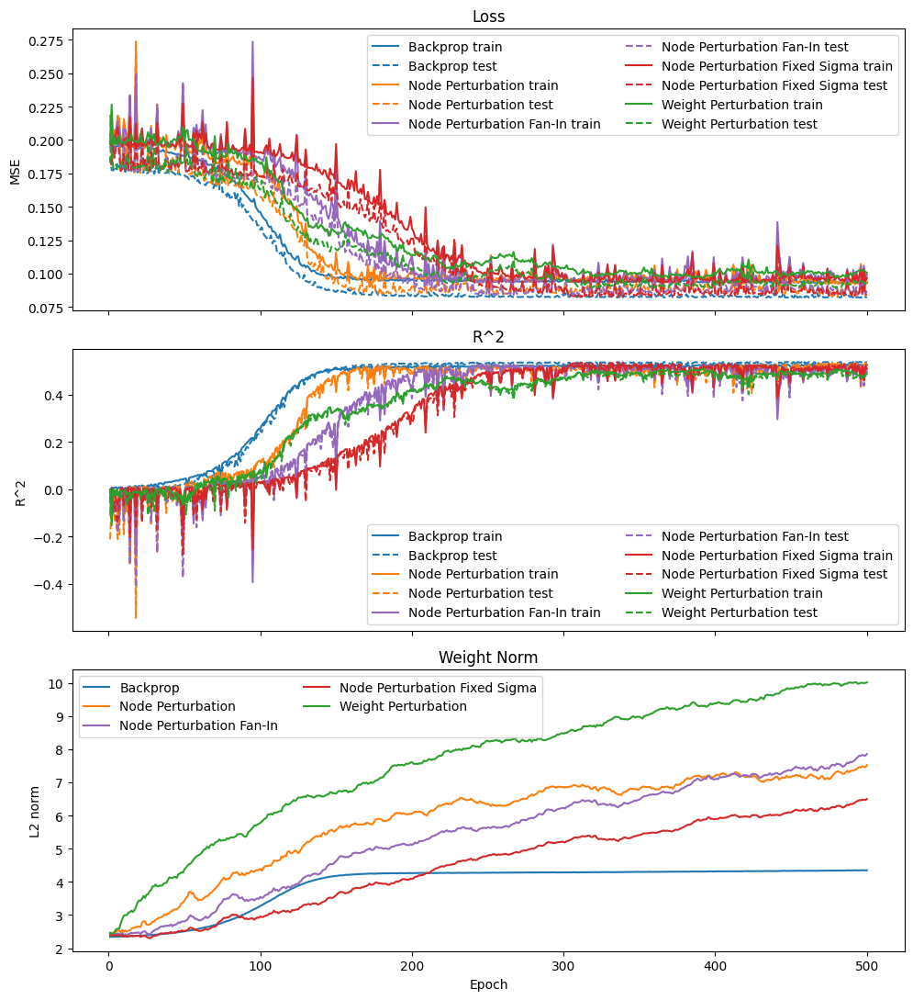

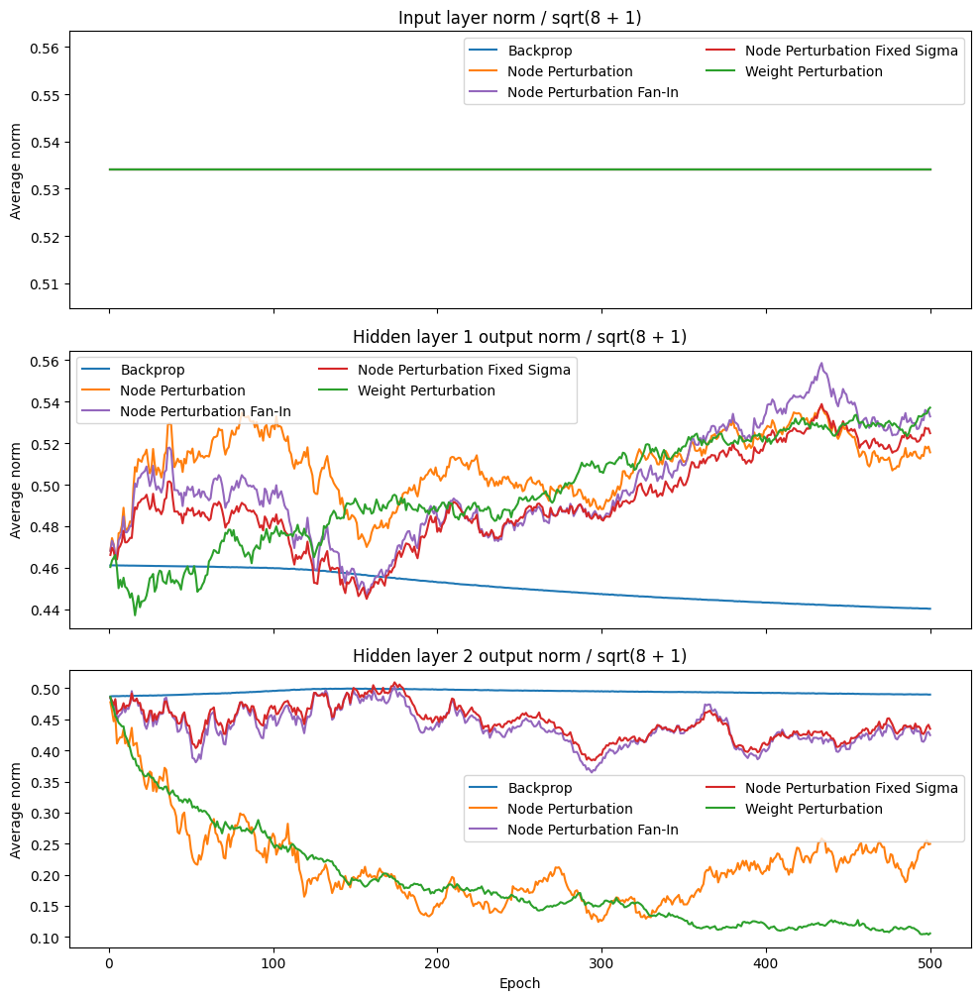

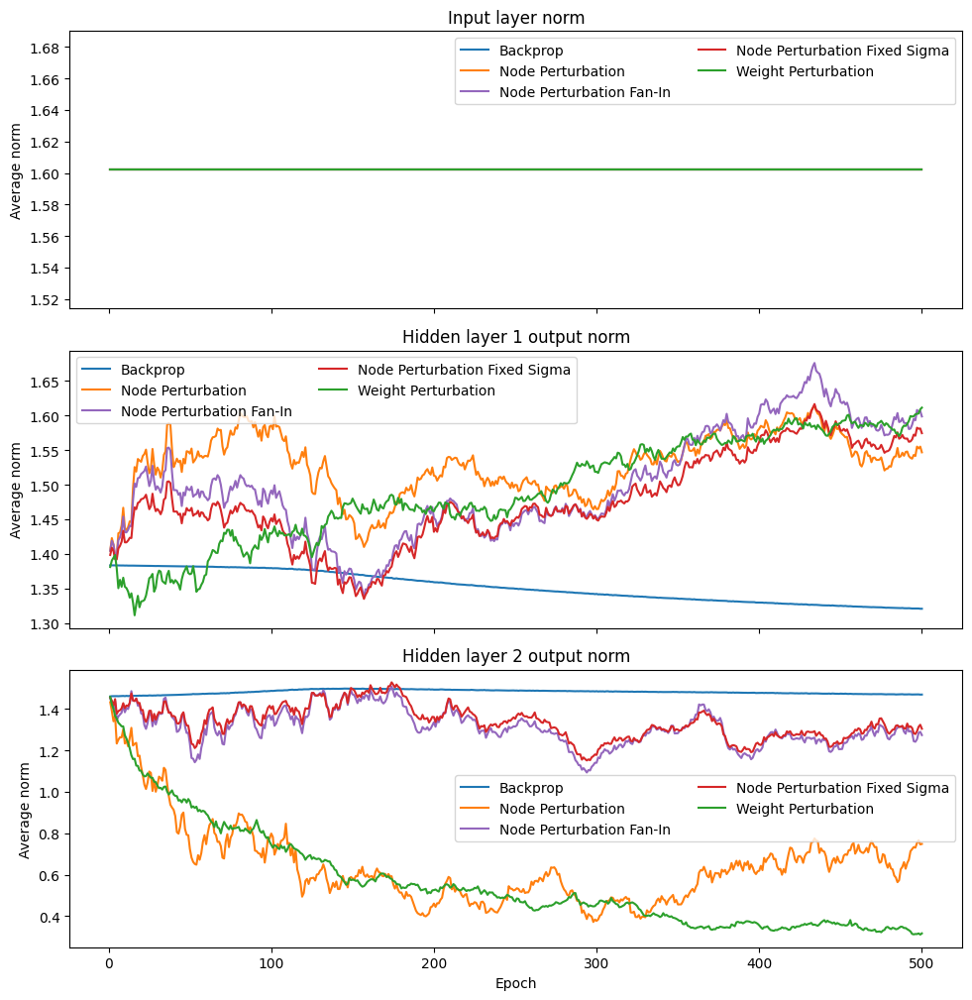

In [10]:
# Balanced widths | input in [-1, 1] | Optional single-config runner

SECTION1_RUN_METHODS = ["bp", "np", "np_fixed", "np_fan_in", "wp"]


section1_single_results = {}

print(
    f"Running {len(SECTION1_RUN_CONFIGS)} config(s) | "
    f"epochs={SECTION1_FINAL_EPOCHS}, seed=0, dims={SECTION1_DIMENSIONS}, input_scale={SECTION1_INPUT_SCALE}, device={device}"
)

SECTION1_RUN_CONFIGS = {
    "bp": {"lr": 0.1},
    "np": {"lr": 0.2*0.75, "sigma": 0.15},
    "np_fan_in": {"lr": 0.15*0.75, "sigma": 0.1},
    "np_fixed": {"lr": 0.11*0.75, "sigma": 0.3},
    "wp": {"lr": 0.09*0.75, "sigma": 0.225},
}

for method in SECTION1_RUN_METHODS:
    if method not in SECTION1_RUN_CONFIGS:
        continue
    config = SECTION1_RUN_CONFIGS[method]
    sigma_str = f", sigma={config['sigma']:.4g}" if "sigma" in config else ""
    print()
    print(f"### Final run | {method} | lr={config['lr']:.4g}{sigma_str}")
    section1_single_results[method] = train_one_run(
        method=method,
        run_config=config,
        data=section1_data,
        dimensions=SECTION1_DIMENSIONS,
        epochs=500,
        seed=1,
        device=device,
        print_every_epoch=1,
    )

display(results_table(section1_single_results))
plot_training_histories(section1_single_results)
plot_layer_output_norm_histories(section1_single_results)
plot_raw_layer_output_norm_histories(section1_single_results)


Running frozen estimator analysis | epochs=100, seed=0, bp_lr=0.1, checkpoints=[1, 50, 100], num_perturbations=50, batch_size=64
{'np': 0.15, 'np_fan_in': 0.1, 'np_fixed': 0.3, 'wp': 0.225}
    bp checkpoint training epoch    1/100 | train_loss=0.1993, train_r2=-0.0151, test_loss=0.1800, test_r2=-0.0157
    bp checkpoint training epoch   10/100 | train_loss=0.1976, train_r2=-0.0062, test_loss=0.1796, test_r2=-0.0132
    bp checkpoint training epoch   20/100 | train_loss=0.1966, train_r2=-0.0009, test_loss=0.1786, test_r2=-0.0077
    bp checkpoint training epoch   30/100 | train_loss=0.1954, train_r2=0.0051, test_loss=0.1789, test_r2=-0.0094
    bp checkpoint training epoch   40/100 | train_loss=0.1952, train_r2=0.0058, test_loss=0.1812, test_r2=-0.0223
    bp checkpoint training epoch   50/100 | train_loss=0.1935, train_r2=0.0147, test_loss=0.1789, test_r2=-0.0094
    bp checkpoint training epoch   60/100 | train_loss=0.1938, train_r2=0.0131, test_loss=0.1817, test_r2=-0.0251
    bp ch

/tmp/ipykernel_4461/2878093861.py:516: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  return float(torch.dot(a, b) / (a_norm * b_norm + eps))


,checkpoint_epoch,checkpoint_fraction,method,sigma,component,component_label,layer_index,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.01,np,0.150,all,All layers,-1,0.082762,0.428578,0.009995,0.000205
1,1,0.01,np_fan_in,0.100,all,All layers,-1,0.086732,0.465922,0.009930,0.000203
2,1,0.01,np_fixed,0.300,all,All layers,-1,0.046813,0.281461,0.009945,0.000212
3,1,0.01,wp,0.225,all,All layers,-1,0.027789,0.179936,0.074518,0.001578
4,50,0.50,np,0.150,all,All layers,-1,0.090204,0.516022,0.009579,0.000191
5,50,0.50,np_fan_in,0.100,all,All layers,-1,0.101151,0.576061,0.009942,0.000213
6,50,0.50,np_fixed,0.300,all,All layers,-1,0.060173,0.362800,0.009947,0.000208
7,50,0.50,wp,0.225,all,All layers,-1,0.040776,0.283982,0.072421,0.001470
8,100,1.00,np,0.150,all,All layers,-1,0.125606,0.649603,0.008431,0.000152
9,100,1.00,np_fan_in,0.100,all,All layers,-1,0.111112,0.520968,0.008823,0.000189


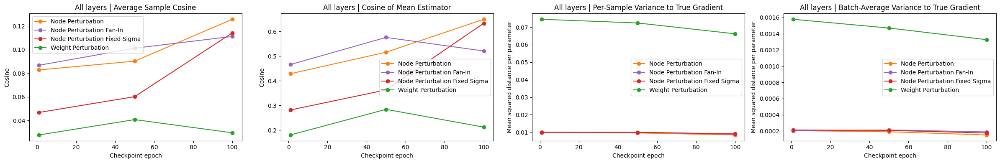

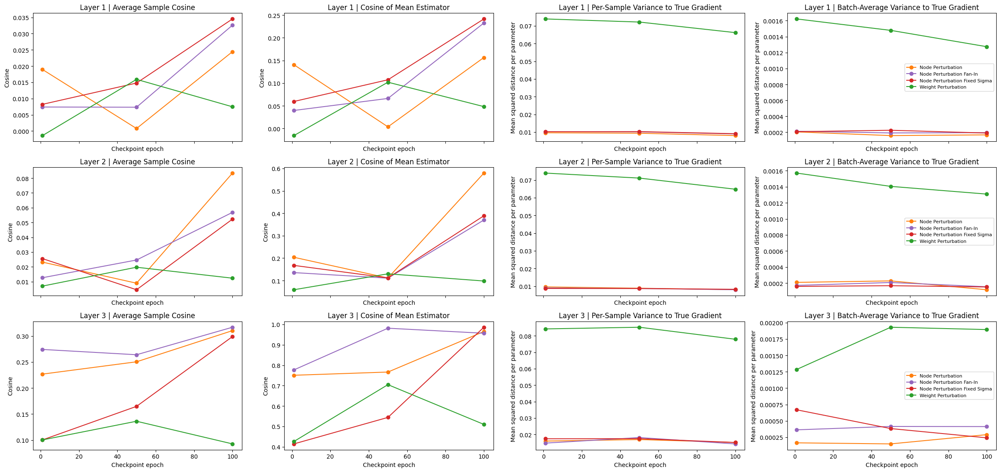

In [13]:
# Balanced widths | input in [-1, 1] | Frozen-Backprop Estimator Analysis

print(
    f"Running frozen estimator analysis | epochs={SECTION1_ANALYSIS_EPOCHS}, seed={SECTION1_ANALYSIS_SEED}, "
    f"bp_lr={SECTION1_ANALYSIS_BP_LR}, checkpoints={SECTION1_ANALYSIS_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION1_ANALYSIS_NUM_PERTURBATIONS}, batch_size={SECTION1_BATCH_SIZE}"
)
print(SECTION1_ANALYSIS_METHOD_SIGMAS)

section1_checkpoint_states = train_backprop_checkpoint_states(
    data=section1_data,
    dimensions=SECTION1_DIMENSIONS,
    epochs=SECTION1_ANALYSIS_EPOCHS,
    seed=SECTION1_ANALYSIS_SEED,
    device=device,
    lr=SECTION1_ANALYSIS_BP_LR,
    checkpoint_epochs=SECTION1_ANALYSIS_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION1_ANALYSIS_EPOCHS // 10),
)

section1_frozen_stats_df = analyze_frozen_backprop_estimators(
    checkpoint_states=section1_checkpoint_states,
    data=section1_data,
    dimensions=SECTION1_DIMENSIONS,
    device=device,
    method_sigmas=SECTION1_ANALYSIS_METHOD_SIGMAS,
    num_perturbations=SECTION1_ANALYSIS_NUM_PERTURBATIONS,
    batch_size=SECTION1_BATCH_SIZE,
)

display(section1_frozen_stats_df.sort_values(["layer_index", "checkpoint_epoch", "method"]).reset_index(drop=True))
plot_frozen_estimator_statistics(section1_frozen_stats_df)


Running frozen sigma search | epochs=120, seed=0, bp_lr=0.1, checkpoints=[1, 60, 120], num_perturbations=100, batch_size=64
{'np': [0.15, 0.175, 0.2], 'np_fan_in': [0.1, 0.125, 0.15], 'np_fixed': [0.35, 0.45, 0.55], 'wp': [0.2, 0.225, 0.25]}
    bp checkpoint training epoch    1/120 | train_loss=0.1993, train_r2=-0.0151, test_loss=0.1800, test_r2=-0.0157
    bp checkpoint training epoch   12/120 | train_loss=0.1973, train_r2=-0.0046, test_loss=0.1815, test_r2=-0.0240
    bp checkpoint training epoch   24/120 | train_loss=0.1961, train_r2=0.0014, test_loss=0.1804, test_r2=-0.0178
    bp checkpoint training epoch   36/120 | train_loss=0.1960, train_r2=0.0019, test_loss=0.1763, test_r2=0.0053
    bp checkpoint training epoch   48/120 | train_loss=0.1933, train_r2=0.0155, test_loss=0.1776, test_r2=-0.0019
    bp checkpoint training epoch   60/120 | train_loss=0.1920, train_r2=0.0221, test_loss=0.1782, test_r2=-0.0052
    bp checkpoint training epoch   72/120 | train_loss=0.1896, train_r2=0

,checkpoint_epoch,checkpoint_fraction,method,sigma,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.008333,np,0.150,0.092331,0.599084,0.010530,0.000097
1,1,0.008333,np,0.175,0.072590,0.536281,0.009339,0.000091
2,1,0.008333,np,0.200,0.105792,0.640476,0.009111,0.000098
3,60,0.500000,np,0.150,0.107564,0.700307,0.009617,0.000097
4,60,0.500000,np,0.175,0.105171,0.632767,0.009085,0.000127
5,60,0.500000,np,0.200,0.102079,0.660533,0.008613,0.000094
6,120,1.000000,np,0.150,0.123526,0.688165,0.006915,0.000093
7,120,1.000000,np,0.175,0.124614,0.754197,0.006764,0.000084
8,120,1.000000,np,0.200,0.115784,0.692908,0.007103,0.000082
9,1,0.008333,np_fan_in,0.100,0.079792,0.527092,0.010325,0.000099


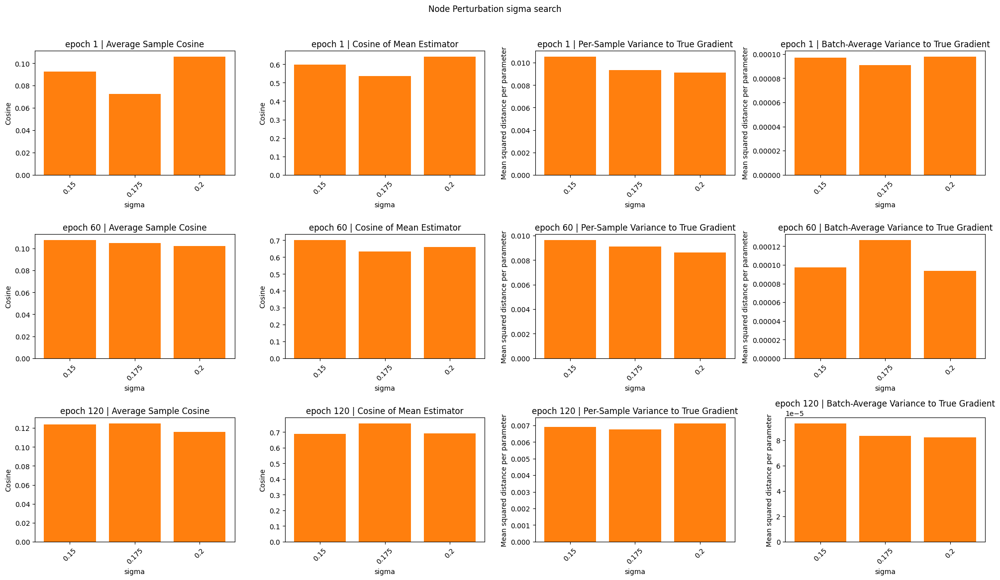

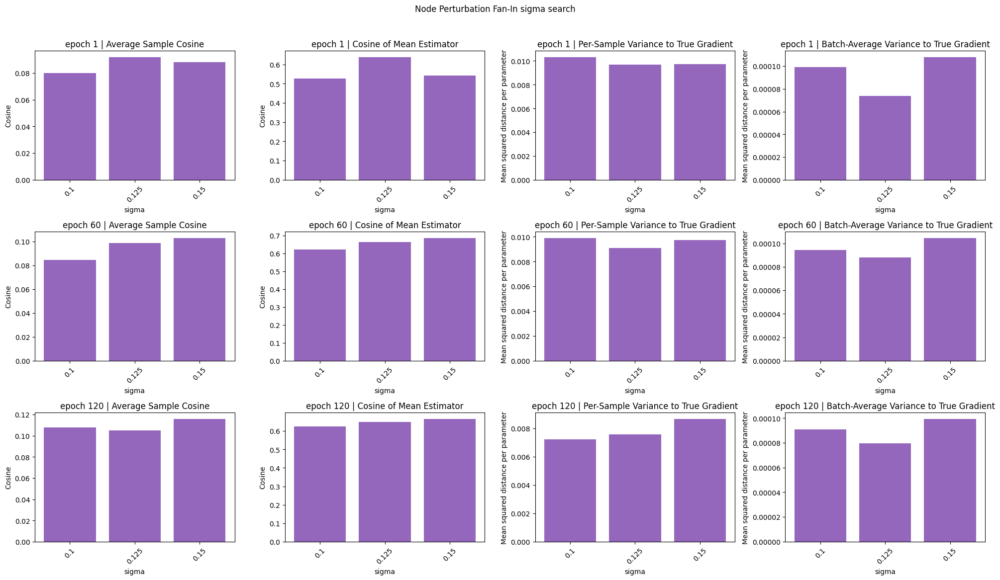

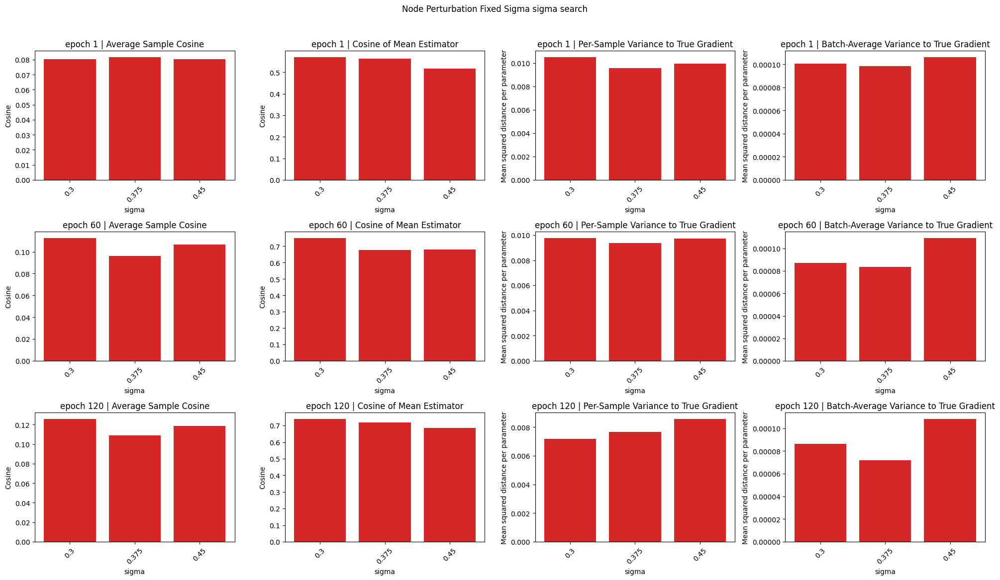

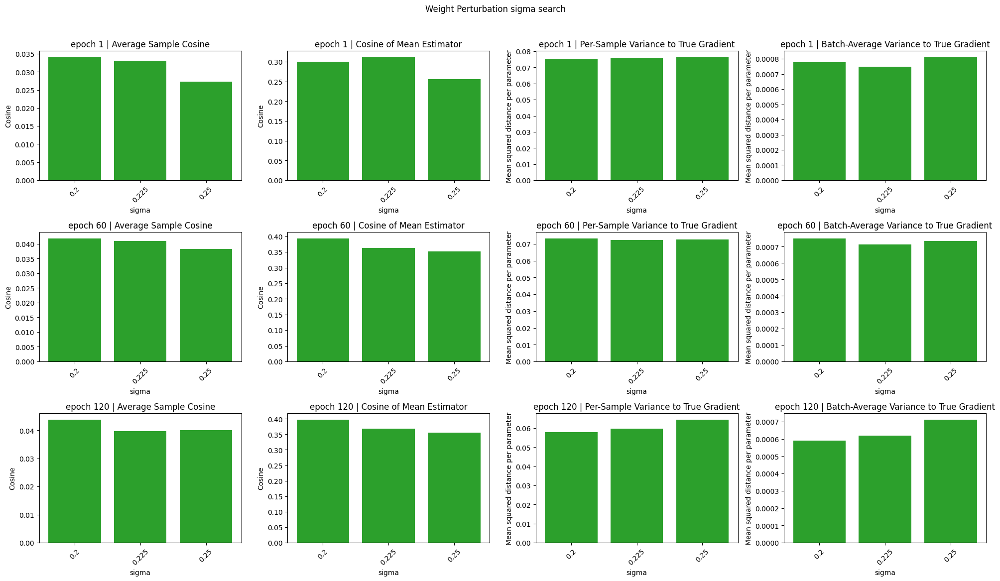

In [ ]:
# Balanced widths | input in [-1, 1] | Frozen-Backprop Sigma Search

print(
    f"Running frozen sigma search | epochs={SECTION1_SIGMA_SEARCH_EPOCHS}, seed={SECTION1_SIGMA_SEARCH_SEED}, "
    f"bp_lr={SECTION1_SIGMA_SEARCH_BP_LR}, checkpoints={SECTION1_SIGMA_SEARCH_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION1_SIGMA_SEARCH_NUM_PERTURBATIONS}, batch_size={SECTION1_BATCH_SIZE}"
)
print(SECTION1_SIGMA_SEARCH_METHOD_SIGMA_GRID)


SECTION1_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    "np": [0.15, 0.175, 0.2],
    "np_fan_in": [0.1, 0.125, 0.15],
    "np_fixed": [0.3, 0.375, 0.45],
    "wp": [0.2, 0.225, 0.25],
}
section1_sigma_search_checkpoint_states = train_backprop_checkpoint_states(
    data=section1_data,
    dimensions=SECTION1_DIMENSIONS,
    epochs=SECTION1_SIGMA_SEARCH_EPOCHS,
    seed=SECTION1_SIGMA_SEARCH_SEED,
    device=device,
    lr=SECTION1_SIGMA_SEARCH_BP_LR,
    checkpoint_epochs=SECTION1_SIGMA_SEARCH_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION1_SIGMA_SEARCH_EPOCHS // 10),
)

section1_sigma_search_df = analyze_frozen_backprop_sigma_grid(
    checkpoint_states=section1_sigma_search_checkpoint_states,
    data=section1_data,
    dimensions=SECTION1_DIMENSIONS,
    device=device,
    method_sigma_grid=SECTION1_SIGMA_SEARCH_METHOD_SIGMA_GRID,
    num_perturbations=SECTION1_SIGMA_SEARCH_NUM_PERTURBATIONS,
    batch_size=SECTION1_BATCH_SIZE,
)

display(section1_sigma_search_df.sort_values(["method", "checkpoint_epoch", "sigma"]).reset_index(drop=True))
plot_frozen_sigma_search_results(section1_sigma_search_df)


## Uneven widths | input in [-1, 1]

This section keeps the synthetic vector-regression task fixed and only changes the architecture / input scale for the hypothesis test.


In [ ]:
# Uneven widths | input in [-1, 1]

SECTION2_TITLE = 'Uneven widths | input in [-1, 1]'
SECTION2_INPUT_DIM = BASE_INPUT_DIM
SECTION2_INPUT_SCALE = 1.0
SECTION2_DIMENSIONS = (8, 128, 2, 1)
SECTION2_BATCH_SIZE = BASE_BATCH_SIZE
SECTION2_EVAL_BATCH_SIZE = BASE_EVAL_BATCH_SIZE
SECTION2_TRAIN_SAMPLES = BASE_TRAIN_SAMPLES
SECTION2_TEST_SAMPLES = BASE_TEST_SAMPLES
SECTION2_TRAIN_NOISE_STD = BASE_TRAIN_NOISE_STD
SECTION2_SWEEP_EPOCHS = BASE_SWEEP_EPOCHS
SECTION2_FINAL_EPOCHS = BASE_FINAL_EPOCHS
SECTION2_SWEEP_SEEDS = list(BASE_SWEEP_SEEDS)
SECTION2_NUM_WORKERS = BASE_NUM_WORKERS

SECTION2_SWEEP_METHODS = list(METHOD_LABELS.keys())
SECTION2_RUN_METHODS = list(METHOD_LABELS.keys())

SECTION2_SEARCH_SPACES = {
    method: [dict(config) for config in configs]
    for method, configs in BASE_SEARCH_SPACES.items()
}
SECTION2_RUN_CONFIGS = {method: dict(config) for method, config in BASE_RUN_CONFIGS.items()}

SECTION2_ANALYSIS_EPOCHS = BASE_ANALYSIS_EPOCHS
SECTION2_ANALYSIS_SEED = BASE_ANALYSIS_SEED
SECTION2_ANALYSIS_BP_LR = BASE_ANALYSIS_BP_LR
SECTION2_ANALYSIS_NUM_PERTURBATIONS = BASE_ANALYSIS_NUM_PERTURBATIONS
SECTION2_ANALYSIS_METHOD_SIGMAS = dict(BASE_ANALYSIS_METHOD_SIGMAS)

SECTION2_SIGMA_SEARCH_EPOCHS = BASE_SIGMA_SEARCH_EPOCHS
SECTION2_SIGMA_SEARCH_SEED = BASE_SIGMA_SEARCH_SEED
SECTION2_SIGMA_SEARCH_BP_LR = BASE_SIGMA_SEARCH_BP_LR
SECTION2_SIGMA_SEARCH_NUM_PERTURBATIONS = BASE_SIGMA_SEARCH_NUM_PERTURBATIONS
SECTION2_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    method: list(sigmas)
    for method, sigmas in BASE_SIGMA_SEARCH_METHOD_SIGMA_GRID.items()
}

SECTION2_ANALYSIS_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION2_ANALYSIS_EPOCHS // 2), SECTION2_ANALYSIS_EPOCHS})
SECTION2_SIGMA_SEARCH_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION2_SIGMA_SEARCH_EPOCHS // 2), SECTION2_SIGMA_SEARCH_EPOCHS})

section2_data = load_synthetic_vector_regression_data(
    input_dim=SECTION2_INPUT_DIM,
    input_scale=SECTION2_INPUT_SCALE,
    n_train=SECTION2_TRAIN_SAMPLES,
    n_test=SECTION2_TEST_SAMPLES,
    noise_std=SECTION2_TRAIN_NOISE_STD,
    train_eval_limit=None,
    batch_size=SECTION2_BATCH_SIZE,
    eval_batch_size=SECTION2_EVAL_BATCH_SIZE,
    seed=0,
    num_workers=SECTION2_NUM_WORKERS,
)

print(
    f"SECTION2: train_size={section2_data['train_size']}, train_eval_size={section2_data['train_eval_size']}, "
    f"test_size={section2_data['test_size']}, dims={SECTION2_DIMENSIONS}, batch_size={SECTION2_BATCH_SIZE}, "
    f"input_scale={SECTION2_INPUT_SCALE}, device={device}"
)
print({method: len(configs) for method, configs in SECTION2_SEARCH_SPACES.items()})


SECTION2: train_size=512, train_eval_size=512, test_size=512, dims=(8, 128, 2, 1), batch_size=64, input_scale=1.0, device=cuda
{'bp': 3, 'np': 15, 'np_fan_in': 9, 'np_fixed': 9, 'wp': 9}


In [ ]:
# Uneven widths | input in [-1, 1] | Grid search

section2_active_search_spaces = {
    method: SECTION2_SEARCH_SPACES[method]
    for method in SECTION2_SWEEP_METHODS
}

section2_sweep_results, section2_sweep_df = run_sweep(
    search_spaces=section2_active_search_spaces,
    data=section2_data,
    dimensions=SECTION2_DIMENSIONS,
    sweep_epochs=SECTION2_SWEEP_EPOCHS,
    seeds=SECTION2_SWEEP_SEEDS,
    device=device,
)

display(summarize_top_configs(section2_sweep_df, top_k=5))

section2_best_configs_df = select_best_configs(section2_sweep_df)
display(section2_best_configs_df)


Starting sweep with total_runs=45, device=cuda

=== Run 1/45 | bp | lr=0.075 | seed=0 ===
    epoch  1/100 | bp | lr=0.075 | train_loss=0.1949, train_r2=0.0075, test_loss=0.1792, test_r2=-0.0109
    epoch  2/100 | bp | lr=0.075 | train_loss=0.1942, train_r2=0.0110, test_loss=0.1767, test_r2=0.0032
    epoch  3/100 | bp | lr=0.075 | train_loss=0.1939, train_r2=0.0128, test_loss=0.1759, test_r2=0.0077
    epoch  4/100 | bp | lr=0.075 | train_loss=0.1935, train_r2=0.0145, test_loss=0.1776, test_r2=-0.0020
    epoch  5/100 | bp | lr=0.075 | train_loss=0.1940, train_r2=0.0122, test_loss=0.1797, test_r2=-0.0138
    epoch  6/100 | bp | lr=0.075 | train_loss=0.1930, train_r2=0.0173, test_loss=0.1778, test_r2=-0.0033
    epoch  7/100 | bp | lr=0.075 | train_loss=0.1920, train_r2=0.0222, test_loss=0.1754, test_r2=0.0102
    epoch  8/100 | bp | lr=0.075 | train_loss=0.1916, train_r2=0.0242, test_loss=0.1737, test_r2=0.0198
    epoch  9/100 | bp | lr=0.075 | train_loss=0.1912, train_r2=0.0266, tes

KeyboardInterrupt: 

Strømmer utdata som er avkortet til de siste 5000 linjene.
    epoch  9/1000 | bp | lr=0.1 | train_loss=0.1898, train_r2=0.0335, test_loss=0.1715, test_r2=0.0322
    epoch 10/1000 | bp | lr=0.1 | train_loss=0.1894, train_r2=0.0356, test_loss=0.1705, test_r2=0.0380
    epoch 11/1000 | bp | lr=0.1 | train_loss=0.1885, train_r2=0.0399, test_loss=0.1699, test_r2=0.0413
    epoch 12/1000 | bp | lr=0.1 | train_loss=0.1874, train_r2=0.0457, test_loss=0.1708, test_r2=0.0364
    epoch 13/1000 | bp | lr=0.1 | train_loss=0.1868, train_r2=0.0488, test_loss=0.1711, test_r2=0.0348
    epoch 14/1000 | bp | lr=0.1 | train_loss=0.1862, train_r2=0.0517, test_loss=0.1676, test_r2=0.0544
    epoch 15/1000 | bp | lr=0.1 | train_loss=0.1855, train_r2=0.0554, test_loss=0.1667, test_r2=0.0596
    epoch 16/1000 | bp | lr=0.1 | train_loss=0.1849, train_r2=0.0584, test_loss=0.1705, test_r2=0.0379
    epoch 17/1000 | bp | lr=0.1 | train_loss=0.1881, train_r2=0.0422, test_loss=0.1770, test_r2=0.0011
    epoch 18/1

,method,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec
0,bp,0.092230,0.530325,0.082549,0.534212,0.082086,0.536825,False,32.246941
1,np,0.110329,0.438157,0.097733,0.448537,0.086628,0.511199,False,33.561085
2,np_fan_in,0.097331,0.504349,0.087517,0.506185,0.082091,0.536799,False,30.077213
3,np_fixed,0.108485,0.447549,0.096698,0.454377,0.082963,0.531879,False,32.095101
4,wp,0.108096,0.449531,0.105361,0.405495,0.088889,0.498440,False,31.646020


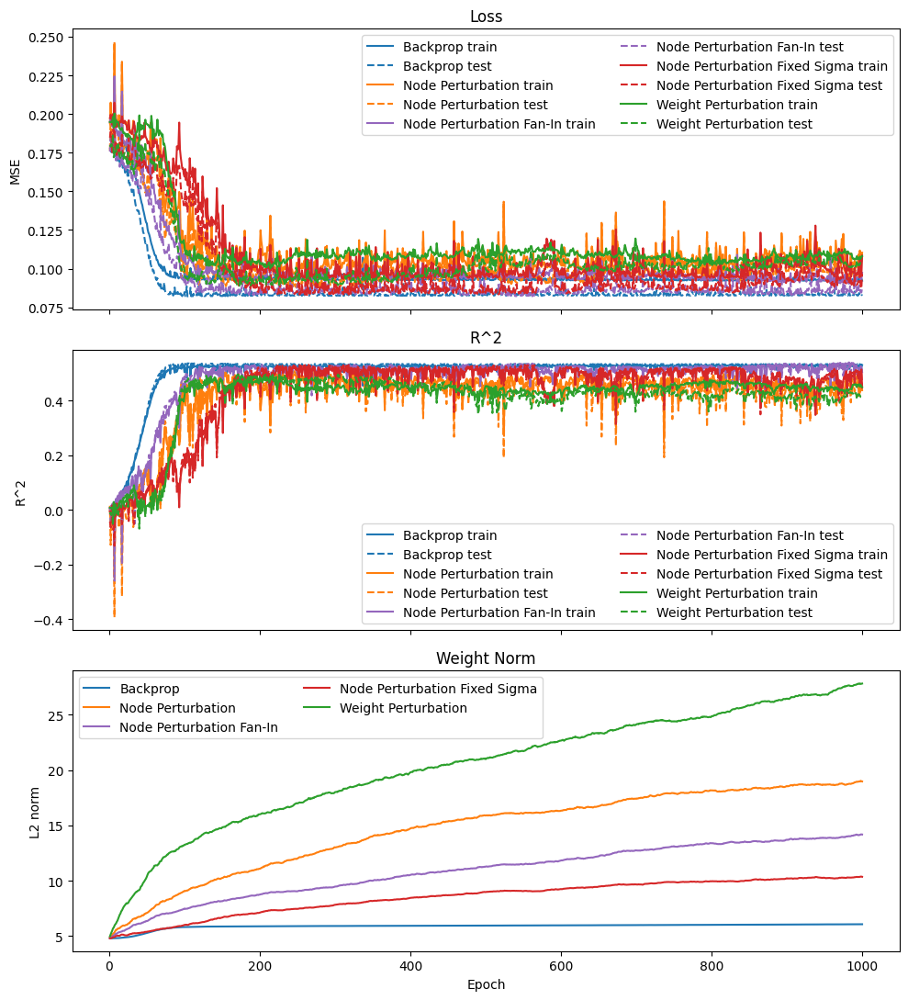

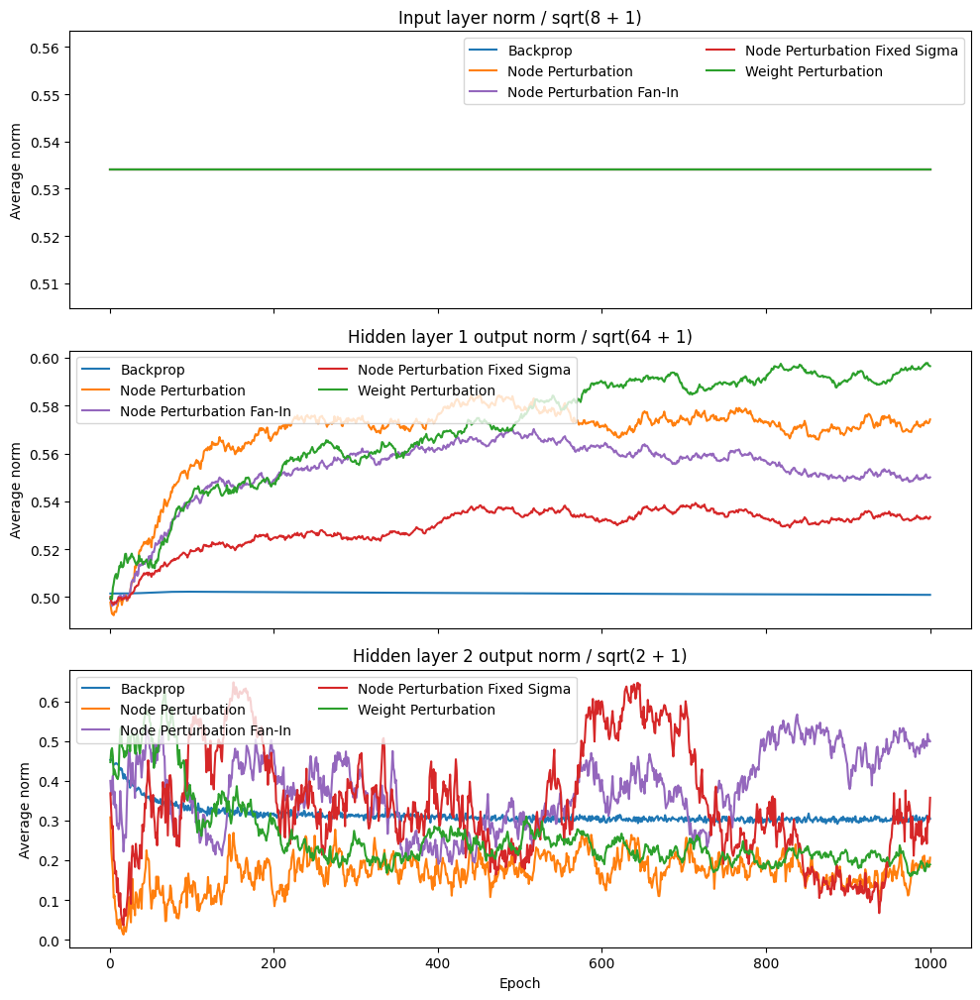

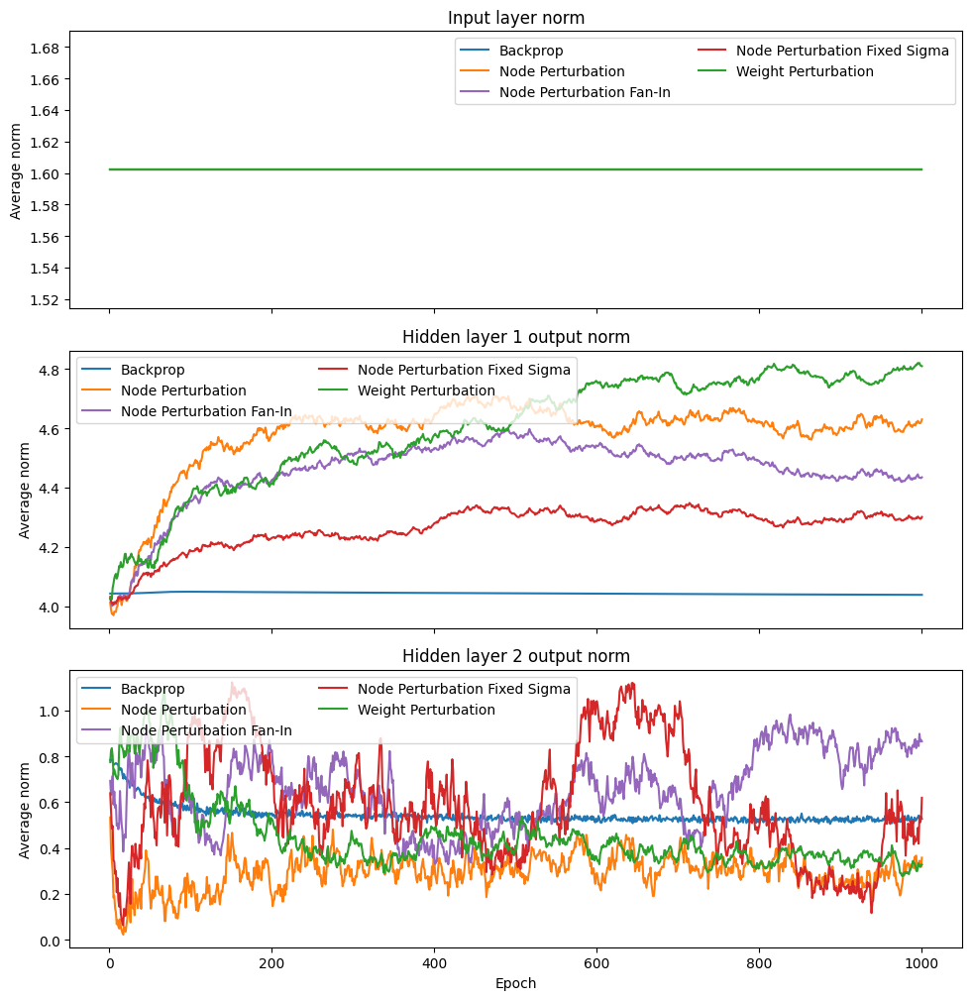

In [ ]:
# Uneven widths | input in [-1, 1] | Optional single-config runner

section2_single_results = {}

print(
    f"Running {len(SECTION2_RUN_CONFIGS)} config(s) | "
    f"epochs={SECTION2_FINAL_EPOCHS}, seed=0, dims={SECTION2_DIMENSIONS}, input_scale={SECTION2_INPUT_SCALE}, device={device}"
)

for method in SECTION2_RUN_METHODS:
    if method not in SECTION2_RUN_CONFIGS:
        continue
    config = SECTION2_RUN_CONFIGS[method]
    sigma_str = f", sigma={config['sigma']:.4g}" if "sigma" in config else ""
    print()
    print(f"### Final run | {method} | lr={config['lr']:.4g}{sigma_str}")
    section2_single_results[method] = train_one_run(
        method=method,
        run_config=config,
        data=section2_data,
        dimensions=SECTION2_DIMENSIONS,
        epochs=SECTION2_FINAL_EPOCHS,
        seed=0,
        device=device,
        print_every_epoch=1,
    )

display(results_table(section2_single_results))
plot_training_histories(section2_single_results)
plot_layer_output_norm_histories(section2_single_results)
plot_raw_layer_output_norm_histories(section2_single_results)


Running frozen estimator analysis | epochs=100, seed=0, bp_lr=0.1, checkpoints=[1, 50, 100], num_perturbations=50, batch_size=64
{'np': 0.2, 'np_fan_in': 0.2, 'np_fixed': 0.35, 'wp': 0.15}
    bp checkpoint training epoch    1/100 | train_loss=0.1974, train_r2=-0.0050, test_loss=0.1780, test_r2=-0.0041
    bp checkpoint training epoch   10/100 | train_loss=0.1959, train_r2=0.0023, test_loss=0.1778, test_r2=-0.0030
    bp checkpoint training epoch   20/100 | train_loss=0.1948, train_r2=0.0081, test_loss=0.1758, test_r2=0.0079
    bp checkpoint training epoch   30/100 | train_loss=0.1919, train_r2=0.0230, test_loss=0.1742, test_r2=0.0169
    bp checkpoint training epoch   40/100 | train_loss=0.1871, train_r2=0.0472, test_loss=0.1685, test_r2=0.0492
    bp checkpoint training epoch   50/100 | train_loss=0.1788, train_r2=0.0894, test_loss=0.1590, test_r2=0.1029
    bp checkpoint training epoch   60/100 | train_loss=0.1592, train_r2=0.1892, test_loss=0.1433, test_r2=0.1913
    bp checkpoint

,checkpoint_epoch,checkpoint_fraction,method,sigma,component,component_label,layer_index,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.01,np,0.20,all,All layers,-1,0.026040,0.240417,0.004599,0.000049
1,1,0.01,np_fan_in,0.20,all,All layers,-1,0.035016,0.289748,0.002829,0.000031
2,1,0.01,np_fixed,0.35,all,All layers,-1,0.022746,0.209994,0.009078,0.000088
3,1,0.01,wp,0.15,all,All layers,-1,0.008248,0.084131,0.064433,0.000661
4,50,0.50,np,0.20,all,All layers,-1,0.032474,0.274218,0.004587,0.000054
5,50,0.50,np_fan_in,0.20,all,All layers,-1,0.008712,0.059088,0.003380,0.000057
6,50,0.50,np_fixed,0.35,all,All layers,-1,0.041205,0.380602,0.008258,0.000083
7,50,0.50,wp,0.15,all,All layers,-1,0.009609,0.097613,0.061518,0.000626
8,100,1.00,np,0.20,all,All layers,-1,0.022640,0.148311,0.007407,0.000099
9,100,1.00,np_fan_in,0.20,all,All layers,-1,-0.001036,-0.019360,0.008537,0.000184


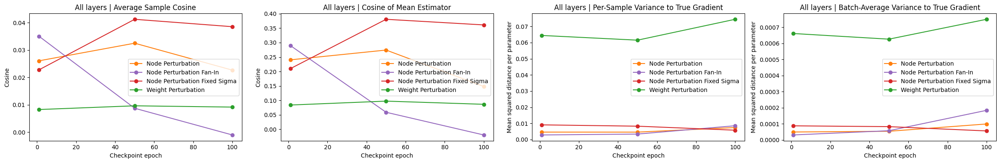

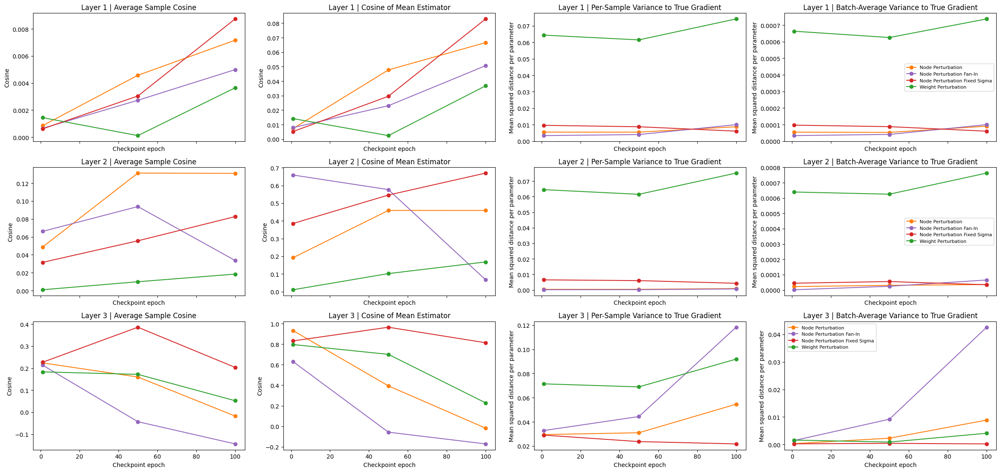

In [ ]:
# Uneven widths | input in [-1, 1] | Frozen-Backprop Estimator Analysis

print(
    f"Running frozen estimator analysis | epochs={SECTION2_ANALYSIS_EPOCHS}, seed={SECTION2_ANALYSIS_SEED}, "
    f"bp_lr={SECTION2_ANALYSIS_BP_LR}, checkpoints={SECTION2_ANALYSIS_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION2_ANALYSIS_NUM_PERTURBATIONS}, batch_size={SECTION2_BATCH_SIZE}"
)
print(SECTION2_ANALYSIS_METHOD_SIGMAS)

SECTION2_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    "np": [0.15, 0.175, 0.2],
    "np_fan_in": [0.1, 0.125, 0.15],
    "np_fixed": [0.3, 0.375, 0.45],
    "wp": [0.2, 0.225, 0.25],
}

section2_checkpoint_states = train_backprop_checkpoint_states(
    data=section2_data,
    dimensions=SECTION2_DIMENSIONS,
    epochs=SECTION2_ANALYSIS_EPOCHS,
    seed=SECTION2_ANALYSIS_SEED,
    device=device,
    lr=SECTION2_ANALYSIS_BP_LR,
    checkpoint_epochs=SECTION2_ANALYSIS_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION2_ANALYSIS_EPOCHS // 10),
)

section2_frozen_stats_df = analyze_frozen_backprop_estimators(
    checkpoint_states=section2_checkpoint_states,
    data=section2_data,
    dimensions=SECTION2_DIMENSIONS,
    device=device,
    method_sigmas=SECTION2_ANALYSIS_METHOD_SIGMAS,
    num_perturbations=100,
    batch_size=SECTION2_BATCH_SIZE,
)

display(section2_frozen_stats_df.sort_values(["layer_index", "checkpoint_epoch", "method"]).reset_index(drop=True))
plot_frozen_estimator_statistics(section2_frozen_stats_df)


Running frozen sigma search | epochs=120, seed=0, bp_lr=0.1, checkpoints=[1, 60, 120], num_perturbations=100, batch_size=64
{'np': [0.15, 0.175, 0.2], 'np_fan_in': [0.1, 0.125, 0.15], 'np_fixed': [0.3, 0.375, 0.45], 'wp': [0.2, 0.225, 0.25]}
    bp checkpoint training epoch    1/120 | train_loss=0.1974, train_r2=-0.0050, test_loss=0.1780, test_r2=-0.0041
    bp checkpoint training epoch   12/120 | train_loss=0.1956, train_r2=0.0039, test_loss=0.1780, test_r2=-0.0046
    bp checkpoint training epoch   24/120 | train_loss=0.1938, train_r2=0.0133, test_loss=0.1753, test_r2=0.0107
    bp checkpoint training epoch   36/120 | train_loss=0.1893, train_r2=0.0359, test_loss=0.1712, test_r2=0.0338
    bp checkpoint training epoch   48/120 | train_loss=0.1793, train_r2=0.0870, test_loss=0.1621, test_r2=0.0854
    bp checkpoint training epoch   60/120 | train_loss=0.1593, train_r2=0.1890, test_loss=0.1442, test_r2=0.1863
    bp checkpoint training epoch   72/120 | train_loss=0.1298, train_r2=0.339

,checkpoint_epoch,checkpoint_fraction,method,sigma,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.008333,np,0.150,0.028721,0.269580,0.006031,0.000062
1,1,0.008333,np,0.175,0.020915,0.195754,0.005060,0.000053
2,1,0.008333,np,0.200,0.032941,0.289187,0.004530,0.000047
3,60,0.500000,np,0.150,0.021727,0.196659,0.005666,0.000060
4,60,0.500000,np,0.175,0.016549,0.135061,0.005327,0.000061
5,60,0.500000,np,0.200,0.017265,0.141073,0.004787,0.000056
6,120,1.000000,np,0.150,0.048218,0.369569,0.007118,0.000090
7,120,1.000000,np,0.175,0.046667,0.380384,0.007215,0.000098
8,120,1.000000,np,0.200,0.032017,0.259644,0.007442,0.000116
9,1,0.008333,np_fan_in,0.100,0.027815,0.267025,0.005126,0.000052


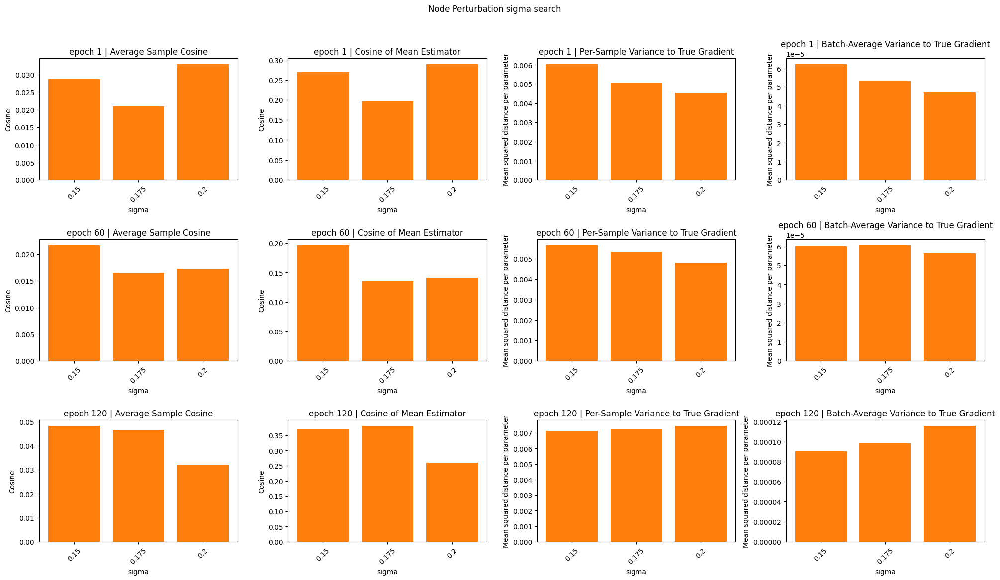

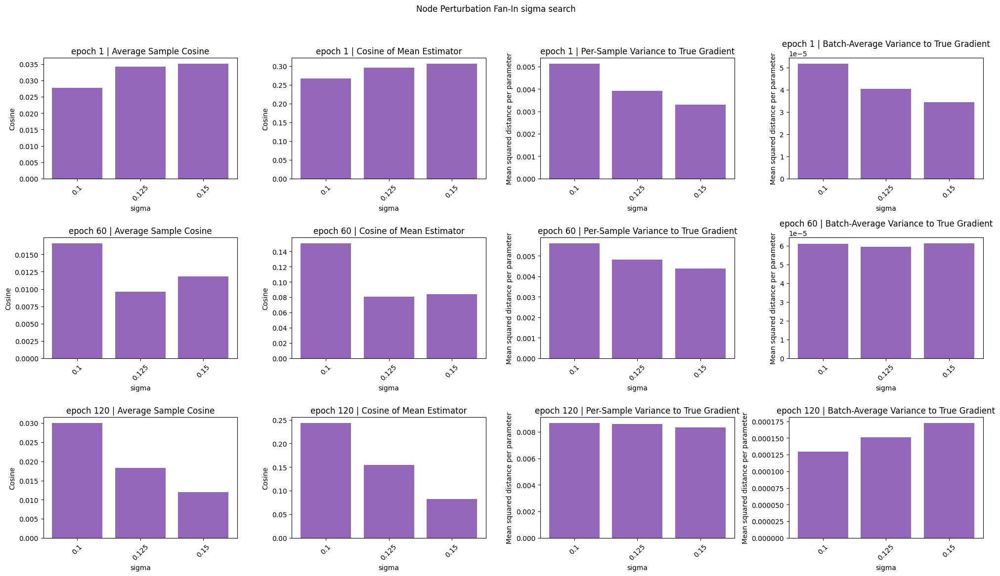

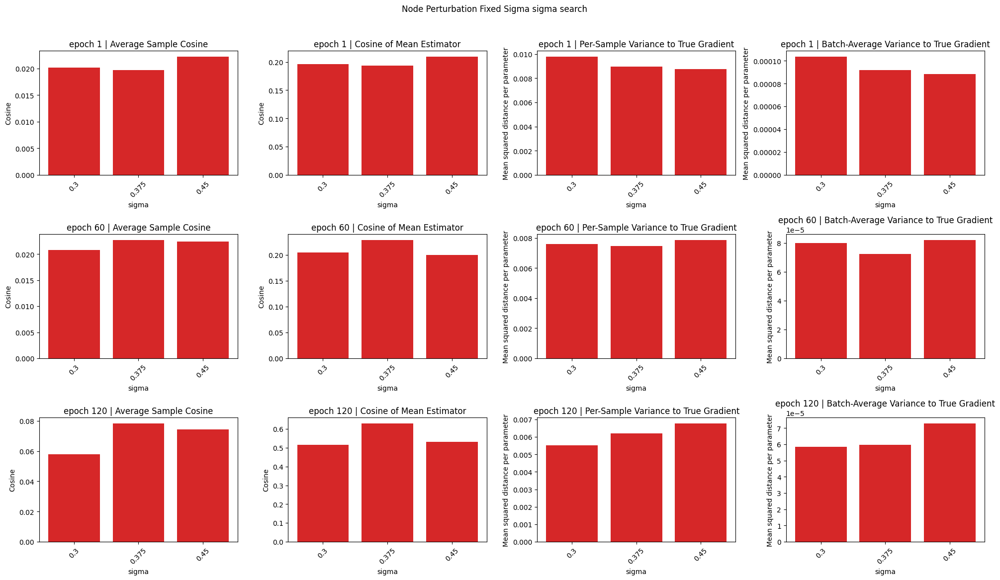

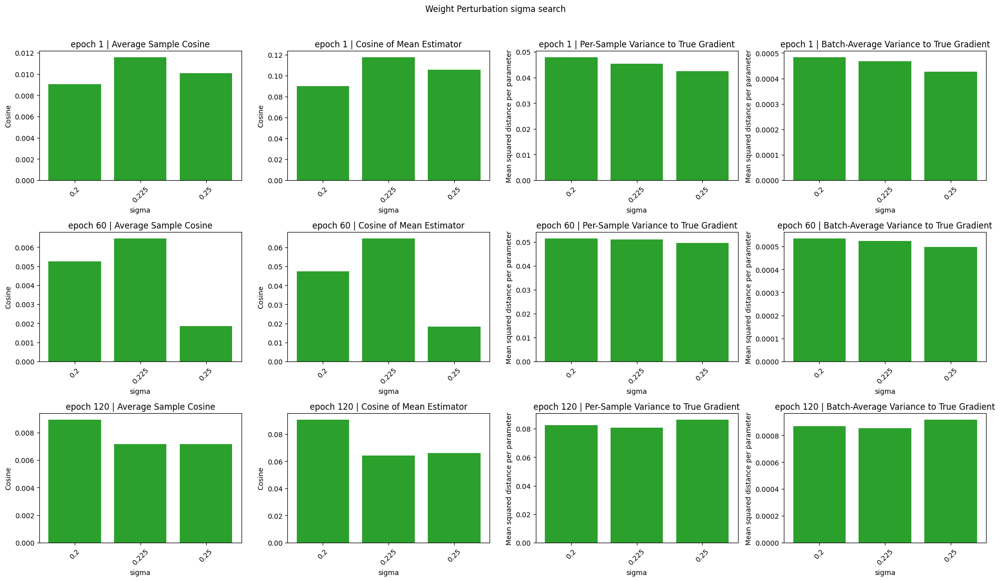

In [ ]:
# Uneven widths | input in [-1, 1] | Frozen-Backprop Sigma Search

print(
    f"Running frozen sigma search | epochs={SECTION2_SIGMA_SEARCH_EPOCHS}, seed={SECTION2_SIGMA_SEARCH_SEED}, "
    f"bp_lr={SECTION2_SIGMA_SEARCH_BP_LR}, checkpoints={SECTION2_SIGMA_SEARCH_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION2_SIGMA_SEARCH_NUM_PERTURBATIONS}, batch_size={SECTION2_BATCH_SIZE}"
)
print(SECTION2_SIGMA_SEARCH_METHOD_SIGMA_GRID)

SECTION2_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    "np": [0.15, 0.175, 0.2],
    "np_fan_in": [0.1, 0.125, 0.15],
    "np_fixed": [0.3, 0.375, 0.45],
    "wp": [0.2, 0.225, 0.25],
}

section2_sigma_search_checkpoint_states = train_backprop_checkpoint_states(
    data=section2_data,
    dimensions=SECTION2_DIMENSIONS,
    epochs=SECTION2_SIGMA_SEARCH_EPOCHS,
    seed=SECTION2_SIGMA_SEARCH_SEED,
    device=device,
    lr=SECTION2_SIGMA_SEARCH_BP_LR,
    checkpoint_epochs=SECTION2_SIGMA_SEARCH_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION2_SIGMA_SEARCH_EPOCHS // 10),
)

section2_sigma_search_df = analyze_frozen_backprop_sigma_grid(
    checkpoint_states=section2_sigma_search_checkpoint_states,
    data=section2_data,
    dimensions=SECTION2_DIMENSIONS,
    device=device,
    method_sigma_grid=SECTION2_SIGMA_SEARCH_METHOD_SIGMA_GRID,
    num_perturbations=SECTION2_SIGMA_SEARCH_NUM_PERTURBATIONS,
    batch_size=SECTION2_BATCH_SIZE,
)

display(section2_sigma_search_df.sort_values(["method", "checkpoint_epoch", "sigma"]).reset_index(drop=True))
plot_frozen_sigma_search_results(section2_sigma_search_df)


## Balanced widths | input in [-5, 5]

This section keeps the synthetic vector-regression task fixed and only changes the architecture / input scale for the hypothesis test.


In [ ]:
# Balanced widths | input in [-5, 5]

SECTION3_TITLE = 'Balanced widths | input in [-5, 5]'
SECTION3_INPUT_DIM = BASE_INPUT_DIM
SECTION3_INPUT_SCALE = 5.0
SECTION3_DIMENSIONS = (8, 8, 8, 1)
SECTION3_BATCH_SIZE = BASE_BATCH_SIZE
SECTION3_EVAL_BATCH_SIZE = BASE_EVAL_BATCH_SIZE
SECTION3_TRAIN_SAMPLES = BASE_TRAIN_SAMPLES
SECTION3_TEST_SAMPLES = BASE_TEST_SAMPLES
SECTION3_TRAIN_NOISE_STD = BASE_TRAIN_NOISE_STD
SECTION3_SWEEP_EPOCHS = BASE_SWEEP_EPOCHS
SECTION3_FINAL_EPOCHS = BASE_FINAL_EPOCHS
SECTION3_SWEEP_SEEDS = list(BASE_SWEEP_SEEDS)
SECTION3_NUM_WORKERS = BASE_NUM_WORKERS

SECTION3_SWEEP_METHODS = list(METHOD_LABELS.keys())
SECTION3_RUN_METHODS = list(METHOD_LABELS.keys())

SECTION3_SEARCH_SPACES = {
    method: [dict(config) for config in configs]
    for method, configs in BASE_SEARCH_SPACES.items()
}
SECTION3_RUN_CONFIGS = {method: dict(config) for method, config in BASE_RUN_CONFIGS.items()}

SECTION3_ANALYSIS_EPOCHS = BASE_ANALYSIS_EPOCHS
SECTION3_ANALYSIS_SEED = BASE_ANALYSIS_SEED
SECTION3_ANALYSIS_BP_LR = BASE_ANALYSIS_BP_LR
SECTION3_ANALYSIS_NUM_PERTURBATIONS = BASE_ANALYSIS_NUM_PERTURBATIONS
SECTION3_ANALYSIS_METHOD_SIGMAS = dict(BASE_ANALYSIS_METHOD_SIGMAS)

SECTION3_SIGMA_SEARCH_EPOCHS = BASE_SIGMA_SEARCH_EPOCHS
SECTION3_SIGMA_SEARCH_SEED = BASE_SIGMA_SEARCH_SEED
SECTION3_SIGMA_SEARCH_BP_LR = BASE_SIGMA_SEARCH_BP_LR
SECTION3_SIGMA_SEARCH_NUM_PERTURBATIONS = BASE_SIGMA_SEARCH_NUM_PERTURBATIONS
SECTION3_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    method: list(sigmas)
    for method, sigmas in BASE_SIGMA_SEARCH_METHOD_SIGMA_GRID.items()
}

SECTION3_ANALYSIS_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION3_ANALYSIS_EPOCHS // 2), SECTION3_ANALYSIS_EPOCHS})
SECTION3_SIGMA_SEARCH_CHECKPOINT_EPOCHS = sorted({max(1, 1), max(1, SECTION3_SIGMA_SEARCH_EPOCHS // 2), SECTION3_SIGMA_SEARCH_EPOCHS})

section3_data = load_synthetic_vector_regression_data(
    input_dim=SECTION3_INPUT_DIM,
    input_scale=SECTION3_INPUT_SCALE,
    n_train=SECTION3_TRAIN_SAMPLES,
    n_test=SECTION3_TEST_SAMPLES,
    noise_std=SECTION3_TRAIN_NOISE_STD,
    train_eval_limit=None,
    batch_size=SECTION3_BATCH_SIZE,
    eval_batch_size=SECTION3_EVAL_BATCH_SIZE,
    seed=0,
    num_workers=SECTION3_NUM_WORKERS,
)

print(
    f"SECTION3: train_size={section3_data['train_size']}, train_eval_size={section3_data['train_eval_size']}, "
    f"test_size={section3_data['test_size']}, dims={SECTION3_DIMENSIONS}, batch_size={SECTION3_BATCH_SIZE}, "
    f"input_scale={SECTION3_INPUT_SCALE}, device={device}"
)
print({method: len(configs) for method, configs in SECTION3_SEARCH_SPACES.items()})


SECTION3: train_size=512, train_eval_size=512, test_size=512, dims=(8, 8, 8, 1), batch_size=64, input_scale=5.0, device=cuda
{'bp': 3, 'np': 15, 'np_fan_in': 9, 'np_fixed': 9, 'wp': 9}


In [ ]:
# Balanced widths | input in [-5, 5] | Grid search

section3_active_search_spaces = {
    method: SECTION3_SEARCH_SPACES[method]
    for method in SECTION3_SWEEP_METHODS
}

section3_sweep_results, section3_sweep_df = run_sweep(
    search_spaces=section3_active_search_spaces,
    data=section3_data,
    dimensions=SECTION3_DIMENSIONS,
    sweep_epochs=SECTION3_SWEEP_EPOCHS,
    seeds=SECTION3_SWEEP_SEEDS,
    device=device,
)

display(summarize_top_configs(section3_sweep_df, top_k=5))

section3_best_configs_df = select_best_configs(section3_sweep_df)
display(section3_best_configs_df)


Starting sweep with total_runs=45, device=cuda

=== Run 1/45 | bp | lr=0.075 | seed=0 ===
    epoch  1/100 | bp | lr=0.075 | train_loss=0.2042, train_r2=-0.0397, test_loss=0.1870, test_r2=-0.0551
    epoch  2/100 | bp | lr=0.075 | train_loss=0.2053, train_r2=-0.0455, test_loss=0.1942, test_r2=-0.0957
    epoch  3/100 | bp | lr=0.075 | train_loss=0.2026, train_r2=-0.0317, test_loss=0.1837, test_r2=-0.0366
    epoch  4/100 | bp | lr=0.075 | train_loss=0.2005, train_r2=-0.0208, test_loss=0.1833, test_r2=-0.0345
    epoch  5/100 | bp | lr=0.075 | train_loss=0.1992, train_r2=-0.0144, test_loss=0.1840, test_r2=-0.0383
    epoch  6/100 | bp | lr=0.075 | train_loss=0.1982, train_r2=-0.0091, test_loss=0.1819, test_r2=-0.0266
    epoch  7/100 | bp | lr=0.075 | train_loss=0.1975, train_r2=-0.0057, test_loss=0.1833, test_r2=-0.0344
    epoch  8/100 | bp | lr=0.075 | train_loss=0.1962, train_r2=0.0008, test_loss=0.1799, test_r2=-0.0151
    epoch  9/100 | bp | lr=0.075 | train_loss=0.1978, train_r2=

,method,lr,sigma,epochs_completed,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec,seed
0,bp,0.125,NaN,100,0.090264,0.540337,0.083303,0.529962,0.082301,0.535613,False,3.072846,0
1,bp,0.100,NaN,100,0.091760,0.532719,0.083688,0.527787,0.082859,0.532463,False,3.045492,0
2,bp,0.075,NaN,100,0.093378,0.524483,0.084144,0.525216,0.083626,0.528139,False,3.714761,0
3,np,0.175,0.15000,100,0.094257,0.520005,0.084564,0.522845,0.084195,0.524928,False,3.860595,0
4,np,0.150,0.15000,100,0.094055,0.521032,0.084678,0.522203,0.084567,0.522826,False,2.847331,0
5,np,0.200,0.15000,100,0.095095,0.515737,0.084940,0.520723,0.084086,0.525543,False,3.017087,0
6,np,0.150,0.17500,100,0.094771,0.517389,0.085152,0.519527,0.085152,0.519527,False,3.789054,0
7,np,0.175,0.17500,100,0.094908,0.516690,0.085219,0.519146,0.084733,0.521891,False,2.885854,0
8,np_fan_in,0.050,0.08125,100,0.111281,0.433310,0.097497,0.449871,0.097497,0.449871,False,2.861819,0
9,np_fan_in,0.050,0.08750,100,0.111860,0.430364,0.098021,0.446913,0.098021,0.446913,False,3.272691,0


,method,lr,sigma,epochs_completed,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec,seed
0,bp,0.125,NaN,100,0.090264,0.540337,0.083303,0.529962,0.082301,0.535613,False,3.072846,0
1,np,0.175,0.15000,100,0.094257,0.520005,0.084564,0.522845,0.084195,0.524928,False,3.860595,0
2,np_fan_in,0.050,0.08125,100,0.111281,0.433310,0.097497,0.449871,0.097497,0.449871,False,2.861819,0
3,np_fixed,0.075,0.35000,100,0.115198,0.413365,0.102875,0.419525,0.098089,0.446528,False,2.916598,0
4,wp,0.050,0.15000,100,0.106975,0.455236,0.096862,0.453450,0.096854,0.453501,False,2.977401,0


Strømmer utdata som er avkortet til de siste 5000 linjene.
    epoch  9/1000 | bp | lr=0.1 | train_loss=0.1971, train_r2=-0.0040, test_loss=0.1756, test_r2=0.0091
    epoch 10/1000 | bp | lr=0.1 | train_loss=0.1913, train_r2=0.0257, test_loss=0.1750, test_r2=0.0128
    epoch 11/1000 | bp | lr=0.1 | train_loss=0.1913, train_r2=0.0260, test_loss=0.1726, test_r2=0.0261
    epoch 12/1000 | bp | lr=0.1 | train_loss=0.1893, train_r2=0.0361, test_loss=0.1716, test_r2=0.0317
    epoch 13/1000 | bp | lr=0.1 | train_loss=0.1875, train_r2=0.0453, test_loss=0.1708, test_r2=0.0362
    epoch 14/1000 | bp | lr=0.1 | train_loss=0.1858, train_r2=0.0536, test_loss=0.1704, test_r2=0.0385
    epoch 15/1000 | bp | lr=0.1 | train_loss=0.1850, train_r2=0.0577, test_loss=0.1719, test_r2=0.0302
    epoch 16/1000 | bp | lr=0.1 | train_loss=0.1828, train_r2=0.0690, test_loss=0.1665, test_r2=0.0604
    epoch 17/1000 | bp | lr=0.1 | train_loss=0.1836, train_r2=0.0649, test_loss=0.1726, test_r2=0.0259
    epoch 18/

,method,final_train_loss,final_train_r2,final_test_loss,final_test_r2,best_test_loss,best_test_r2,diverged,duration_sec
0,bp,0.044076,0.775545,0.051233,0.710918,0.047868,0.729906,False,31.805734
1,np,0.075442,0.615817,0.079640,0.550631,0.078380,0.557737,False,32.939247
2,np_fan_in,0.127459,0.350927,0.118531,0.331185,0.095920,0.458766,False,31.736570
3,np_fixed,0.107472,0.452706,0.099661,0.437660,0.089484,0.495081,False,30.953767
4,wp,0.108150,0.449255,0.108281,0.389022,0.090770,0.487829,False,32.772854


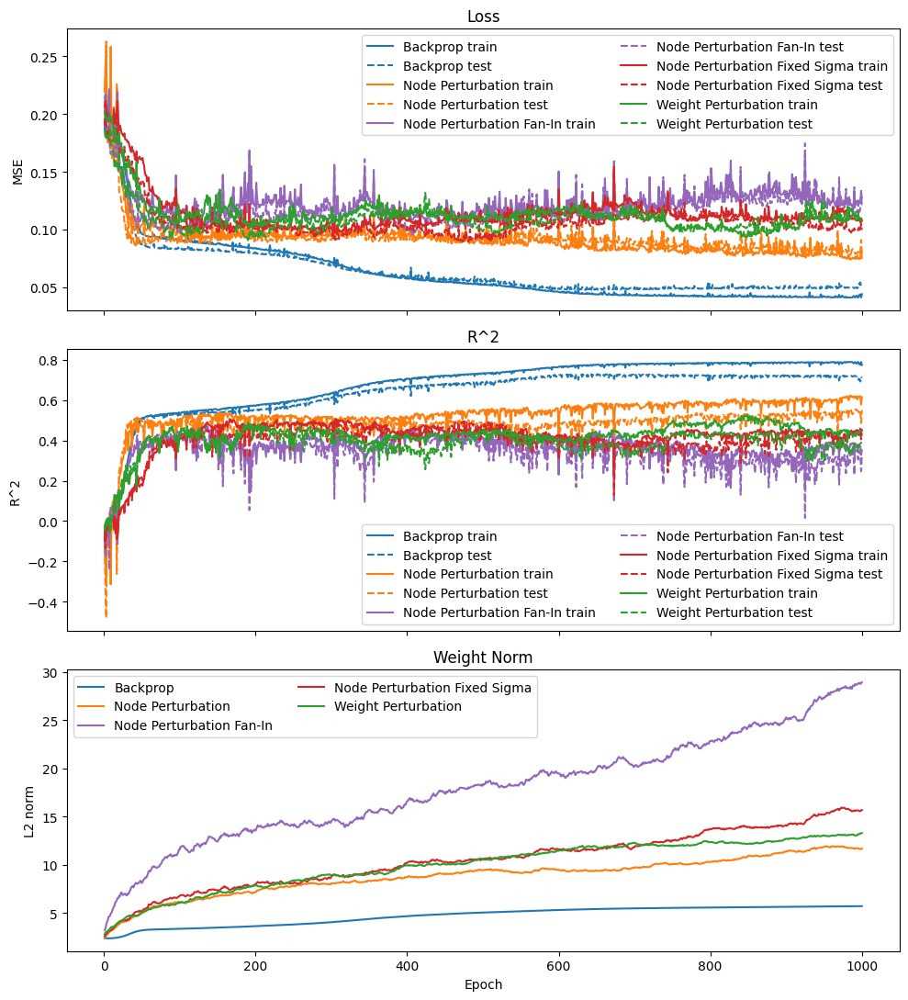

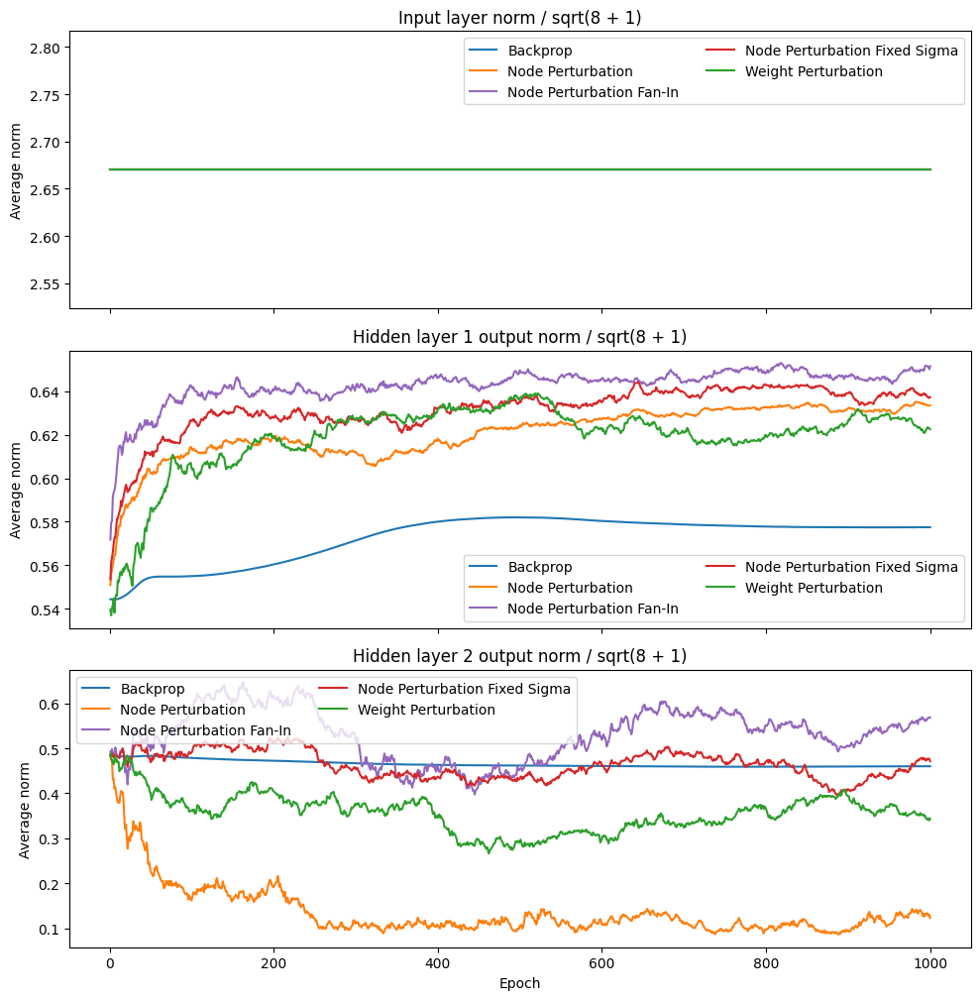

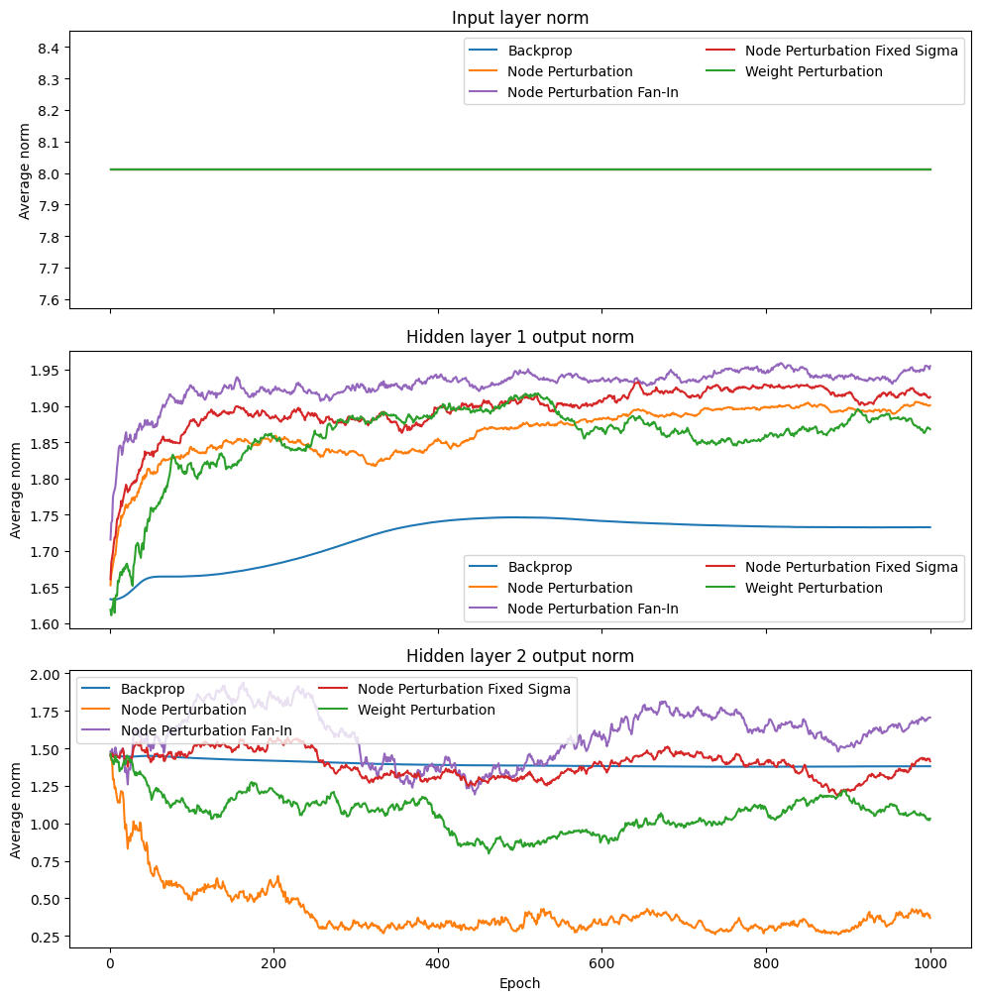

In [ ]:
# Balanced widths | input in [-5, 5] | Optional single-config runner

section3_single_results = {}

print(
    f"Running {len(SECTION3_RUN_CONFIGS)} config(s) | "
    f"epochs={SECTION3_FINAL_EPOCHS}, seed=0, dims={SECTION3_DIMENSIONS}, input_scale={SECTION3_INPUT_SCALE}, device={device}"
)

for method in SECTION3_RUN_METHODS:
    if method not in SECTION3_RUN_CONFIGS:
        continue
    config = SECTION3_RUN_CONFIGS[method]
    sigma_str = f", sigma={config['sigma']:.4g}" if "sigma" in config else ""
    print()
    print(f"### Final run | {method} | lr={config['lr']:.4g}{sigma_str}")
    section3_single_results[method] = train_one_run(
        method=method,
        run_config=config,
        data=section3_data,
        dimensions=SECTION3_DIMENSIONS,
        epochs=SECTION3_FINAL_EPOCHS,
        seed=0,
        device=device,
        print_every_epoch=1,
    )

display(results_table(section3_single_results))
plot_training_histories(section3_single_results)
plot_layer_output_norm_histories(section3_single_results)
plot_raw_layer_output_norm_histories(section3_single_results)


Running frozen estimator analysis | epochs=100, seed=0, bp_lr=0.1, checkpoints=[1, 50, 100], num_perturbations=50, batch_size=64
{'np': 0.2, 'np_fan_in': 0.2, 'np_fixed': 0.35, 'wp': 0.15}
    bp checkpoint training epoch    1/100 | train_loss=0.2044, train_r2=-0.0407, test_loss=0.1859, test_r2=-0.0490
    bp checkpoint training epoch   10/100 | train_loss=0.1914, train_r2=0.0253, test_loss=0.1746, test_r2=0.0150
    bp checkpoint training epoch   20/100 | train_loss=0.1750, train_r2=0.1090, test_loss=0.1591, test_r2=0.1024
    bp checkpoint training epoch   30/100 | train_loss=0.1434, train_r2=0.2696, test_loss=0.1317, test_r2=0.2570
    bp checkpoint training epoch   40/100 | train_loss=0.1112, train_r2=0.4336, test_loss=0.1031, test_r2=0.4181
    bp checkpoint training epoch   50/100 | train_loss=0.0962, train_r2=0.5099, test_loss=0.0869, test_r2=0.5094
    bp checkpoint training epoch   60/100 | train_loss=0.0970, train_r2=0.5060, test_loss=0.0889, test_r2=0.4981
    bp checkpoint 

,checkpoint_epoch,checkpoint_fraction,method,sigma,component,component_label,layer_index,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.01,np,0.20,all,All layers,-1,0.097364,0.501680,0.009009,0.000191
1,1,0.01,np_fan_in,0.20,all,All layers,-1,0.026578,0.177903,0.098637,0.002117
2,1,0.01,np_fixed,0.35,all,All layers,-1,0.023245,0.156733,0.090034,0.001746
3,1,0.01,wp,0.15,all,All layers,-1,0.029515,0.196012,0.090540,0.001870
4,50,0.50,np,0.20,all,All layers,-1,0.063728,0.380913,0.006356,0.000168
5,50,0.50,np_fan_in,0.20,all,All layers,-1,0.026198,0.196555,0.083005,0.001599
6,50,0.50,np_fixed,0.35,all,All layers,-1,0.027303,0.156285,0.054909,0.001201
7,50,0.50,wp,0.15,all,All layers,-1,0.028986,0.199330,0.046944,0.000956
8,100,1.00,np,0.20,all,All layers,-1,0.088266,0.458338,0.006761,0.000152
9,100,1.00,np_fan_in,0.20,all,All layers,-1,0.033734,0.232800,0.081227,0.001693


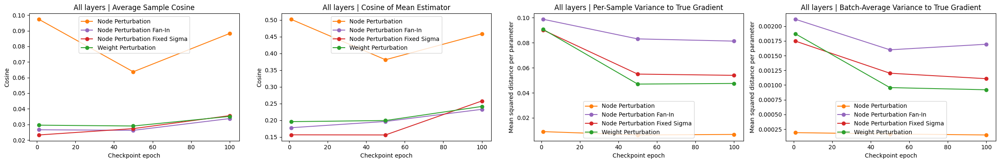

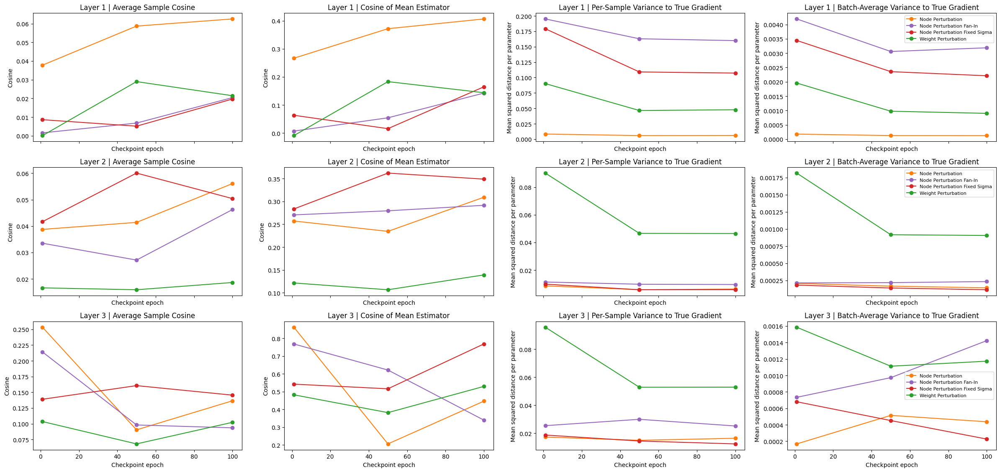

In [ ]:
# Balanced widths | input in [-5, 5] | Frozen-Backprop Estimator Analysis

print(
    f"Running frozen estimator analysis | epochs={SECTION3_ANALYSIS_EPOCHS}, seed={SECTION3_ANALYSIS_SEED}, "
    f"bp_lr={SECTION3_ANALYSIS_BP_LR}, checkpoints={SECTION3_ANALYSIS_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION3_ANALYSIS_NUM_PERTURBATIONS}, batch_size={SECTION3_BATCH_SIZE}"
)
print(SECTION3_ANALYSIS_METHOD_SIGMAS)

section3_checkpoint_states = train_backprop_checkpoint_states(
    data=section3_data,
    dimensions=SECTION3_DIMENSIONS,
    epochs=SECTION3_ANALYSIS_EPOCHS,
    seed=SECTION3_ANALYSIS_SEED,
    device=device,
    lr=SECTION3_ANALYSIS_BP_LR,
    checkpoint_epochs=SECTION3_ANALYSIS_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION3_ANALYSIS_EPOCHS // 10),
)

section3_frozen_stats_df = analyze_frozen_backprop_estimators(
    checkpoint_states=section3_checkpoint_states,
    data=section3_data,
    dimensions=SECTION3_DIMENSIONS,
    device=device,
    method_sigmas=SECTION3_ANALYSIS_METHOD_SIGMAS,
    num_perturbations=SECTION3_ANALYSIS_NUM_PERTURBATIONS,
    batch_size=SECTION3_BATCH_SIZE,
)

display(section3_frozen_stats_df.sort_values(["layer_index", "checkpoint_epoch", "method"]).reset_index(drop=True))
plot_frozen_estimator_statistics(section3_frozen_stats_df)


Running frozen sigma search | epochs=120, seed=0, bp_lr=0.1, checkpoints=[1, 60, 120], num_perturbations=100, batch_size=64
{'np': [0.1, 0.1125, 0.125, 0.1375, 0.15], 'np_fan_in': [0.075, 0.08125, 0.0875, 0.0925, 0.1], 'np_fixed': [0.3, 0.35, 0.4, 0.45, 0.5], 'wp': [0.1, 0.125, 0.15, 0.175, 0.2]}
    bp checkpoint training epoch    1/120 | train_loss=0.2044, train_r2=-0.0407, test_loss=0.1859, test_r2=-0.0490
    bp checkpoint training epoch   12/120 | train_loss=0.1888, train_r2=0.0388, test_loss=0.1741, test_r2=0.0178
    bp checkpoint training epoch   24/120 | train_loss=0.1643, train_r2=0.1631, test_loss=0.1511, test_r2=0.1475
    bp checkpoint training epoch   36/120 | train_loss=0.1210, train_r2=0.3840, test_loss=0.1090, test_r2=0.3847
    bp checkpoint training epoch   48/120 | train_loss=0.0976, train_r2=0.5032, test_loss=0.0885, test_r2=0.5005
    bp checkpoint training epoch   60/120 | train_loss=0.0949, train_r2=0.5169, test_loss=0.0863, test_r2=0.5128
    bp checkpoint trai

,checkpoint_epoch,checkpoint_fraction,method,sigma,avg_sample_cosine,mean_estimate_cosine,sample_variance,batch_variance
0,1,0.008333,np,0.150,0.093082,0.628940,0.010898,0.000104
1,1,0.008333,np,0.175,0.078384,0.585620,0.009611,0.000098
2,1,0.008333,np,0.200,0.106822,0.651107,0.009364,0.000102
3,60,0.500000,np,0.150,0.124221,0.687569,0.005610,0.000061
4,60,0.500000,np,0.175,0.123179,0.652684,0.005967,0.000090
5,60,0.500000,np,0.200,0.101640,0.555085,0.006403,0.000105
6,120,1.000000,np,0.150,0.090175,0.586234,0.005684,0.000085
7,120,1.000000,np,0.175,0.096908,0.627703,0.006114,0.000087
8,120,1.000000,np,0.200,0.067295,0.481727,0.006781,0.000105
9,1,0.008333,np_fan_in,0.100,0.027975,0.242298,0.099610,0.001021


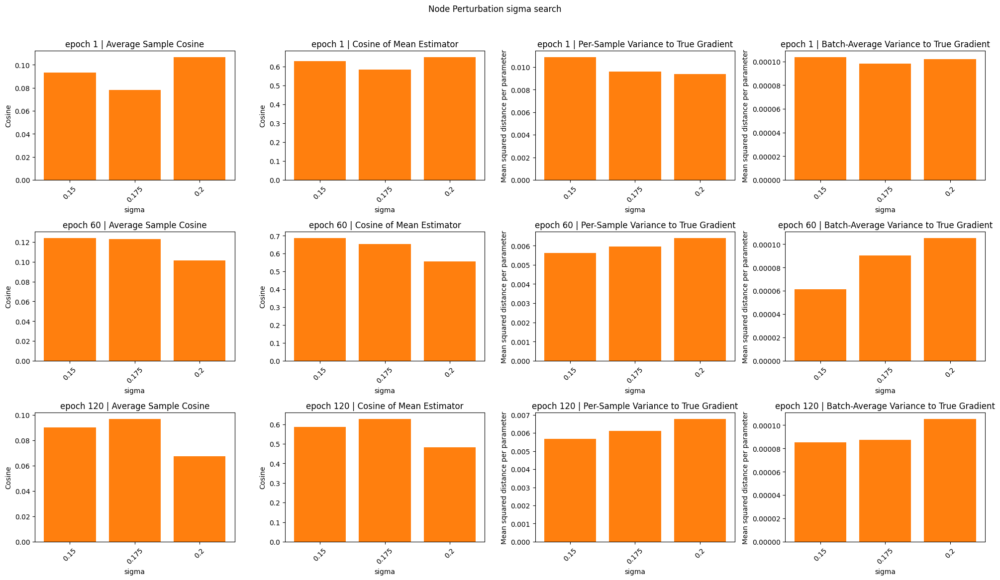

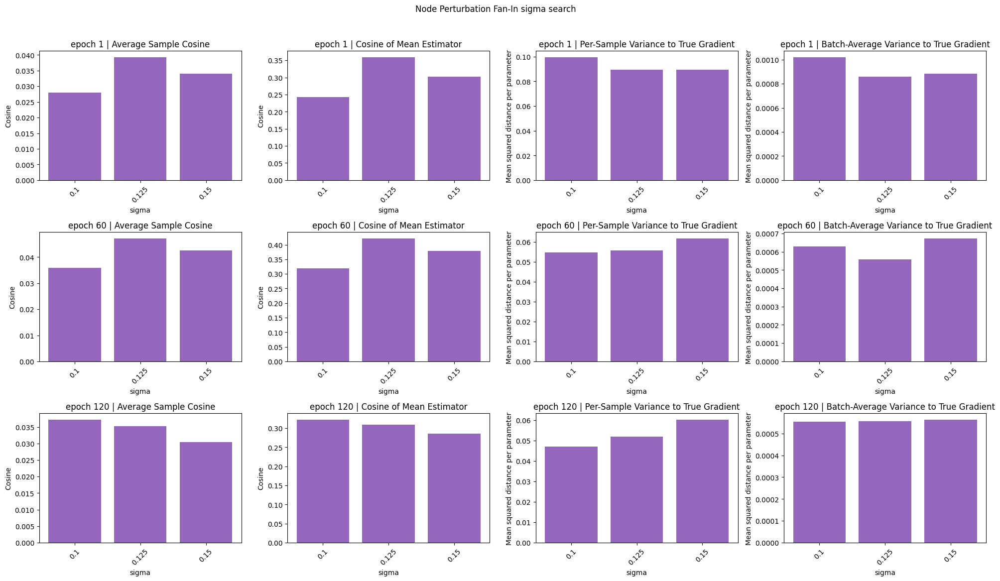

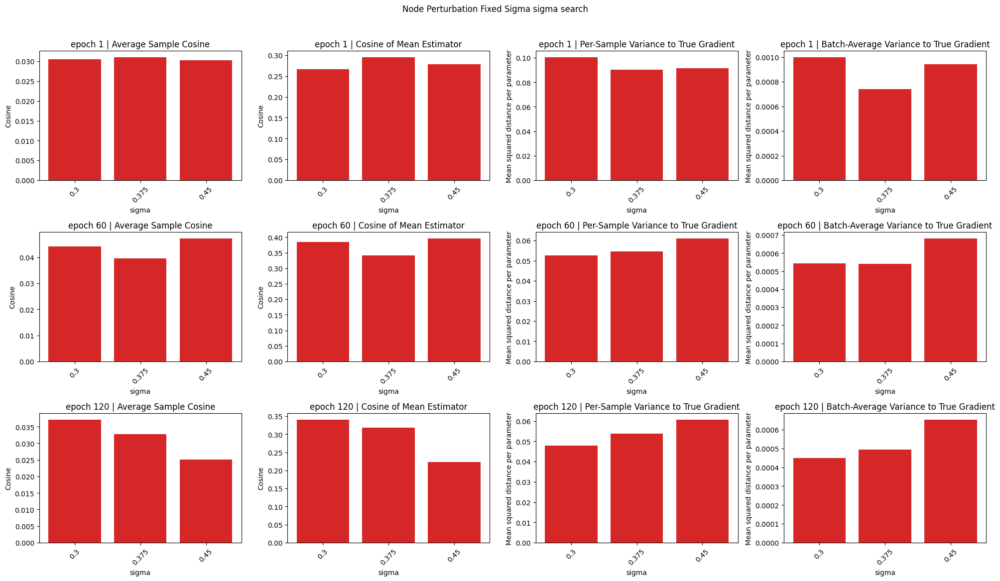

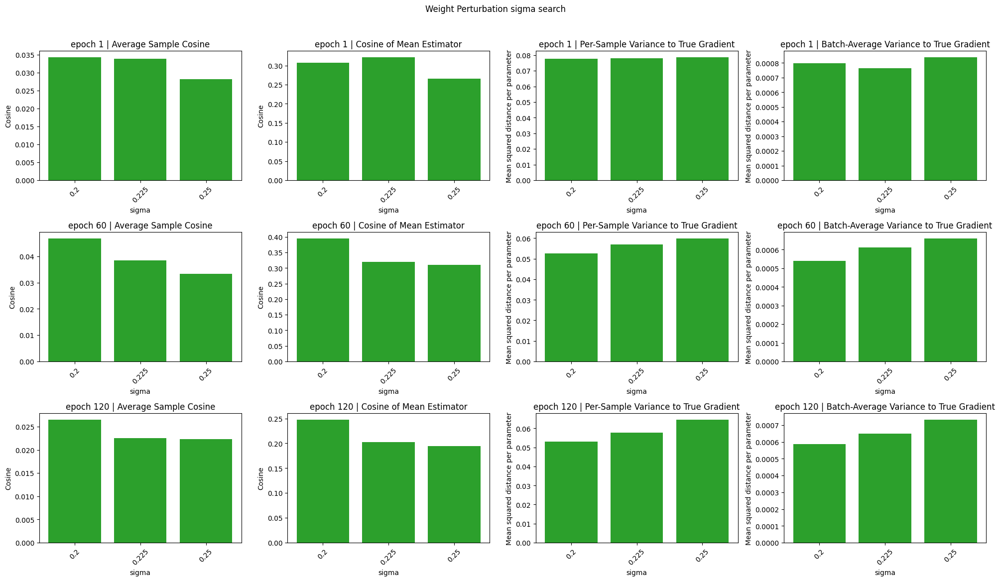

In [ ]:
# Balanced widths | input in [-5, 5] | Frozen-Backprop Sigma Search

print(
    f"Running frozen sigma search | epochs={SECTION3_SIGMA_SEARCH_EPOCHS}, seed={SECTION3_SIGMA_SEARCH_SEED}, "
    f"bp_lr={SECTION3_SIGMA_SEARCH_BP_LR}, checkpoints={SECTION3_SIGMA_SEARCH_CHECKPOINT_EPOCHS}, "
    f"num_perturbations={SECTION3_SIGMA_SEARCH_NUM_PERTURBATIONS}, batch_size={SECTION3_BATCH_SIZE}"
)
print(SECTION3_SIGMA_SEARCH_METHOD_SIGMA_GRID)

SECTION3_SIGMA_SEARCH_METHOD_SIGMA_GRID = {
    "np": [0.15, 0.175, 0.2],
    "np_fan_in": [0.1, 0.125, 0.15],
    "np_fixed": [0.3, 0.375, 0.45],
    "wp": [0.2, 0.225, 0.25],
}

section3_sigma_search_checkpoint_states = train_backprop_checkpoint_states(
    data=section3_data,
    dimensions=SECTION3_DIMENSIONS,
    epochs=SECTION3_SIGMA_SEARCH_EPOCHS,
    seed=SECTION3_SIGMA_SEARCH_SEED,
    device=device,
    lr=SECTION3_SIGMA_SEARCH_BP_LR,
    checkpoint_epochs=SECTION3_SIGMA_SEARCH_CHECKPOINT_EPOCHS,
    print_every_epoch=max(1, SECTION3_SIGMA_SEARCH_EPOCHS // 10),
)

section3_sigma_search_df = analyze_frozen_backprop_sigma_grid(
    checkpoint_states=section3_sigma_search_checkpoint_states,
    data=section3_data,
    dimensions=SECTION3_DIMENSIONS,
    device=device,
    method_sigma_grid=SECTION3_SIGMA_SEARCH_METHOD_SIGMA_GRID,
    num_perturbations=SECTION3_SIGMA_SEARCH_NUM_PERTURBATIONS,
    batch_size=SECTION3_BATCH_SIZE,
)

display(section3_sigma_search_df.sort_values(["method", "checkpoint_epoch", "sigma"]).reset_index(drop=True))
plot_frozen_sigma_search_results(section3_sigma_search_df)
